# Utils

In [1]:
import numpy as np
import numpy.ma as ma
import netCDF4 as nc
import matplotlib.pyplot as plt
import cmocean
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy as cart
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmocean
from matplotlib.animation import FuncAnimation
from matplotlib import animation, rc
from scipy.interpolate import interp1d
from datetime import datetime

from numpy import genfromtxt


from __future__ import division
import itertools

import matplotlib as mpl
from matplotlib.collections import LineCollection
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.patheffects as patheffects
import numpy as np
import pandas as pd
from scipy.cluster import hierarchy

import seaborn as sns
from seaborn import cm
from seaborn.axisgrid import Grid
from seaborn.utils import (despine, axis_ticklabels_overlap, relative_luminance, to_utf8)

from scipy.spatial import cKDTree

import scipy.stats as stats
import xarray as xr
from tqdm import trange
import matplotlib.pyplot as plt
from functools import partial
#import tensorflow_addons as tfa
from skimage.measure import block_reduce
import cmocean
from matplotlib.animation import FuncAnimation
from matplotlib import animation, rc
#Mask 
import pandas as pd
from datetime import datetime

from utils_plot import heatmap2, lon_lat_to_cartesian, interpolate
# Indicate the path to get access to the main four models on HR
path_1ts_lambda100 = 'Results/1Mars/UNet_lambda100_mu0_nu0/'
path_1ts_lambda0 = 'Results/1Mars/UNet_lambda0_mu0_nu0/'
path_2ts_lambda100 = 'Results/21Mars/UNet_lambda100_2ts/'
path_2ts_lambda0 = 'Results/21Mars/UNet_lambda0_2ts/'

TIME_PATH = 'time.npy'
NEXTSIM_PATH = 'Moorings_2009m03.nc'
NEXTSIM_PATH2 = 'Moorings_2009m10.nc'

import matplotlib
matplotlib.rcParams['mathtext.fontset'] = 'dejavuserif'
matplotlib.rcParams['font.family'] = 'dejavuserif'

plt.style.use('/cerea_raid/users/durandc/presentation.mplstyle')

from cmcrameri import cm as cm2

In [163]:
# Data Utils


#Load time information
time = np.load(TIME_PATH, allow_pickle = True)
#Get time for the test year
time = time[2].indexes['time']
#Time info for seasonal forecast
time = time[:1440:2]

datetime_object = pd.to_datetime(time)

#Get access to raw neXtSIM output + mask from masked_array
ds = xr.open_dataset(NEXTSIM_PATH)
ds_sit = ds['sit'].to_masked_array()
mask = ma.getmaskarray(ds_sit[0])

ds2 = xr.open_dataset(NEXTSIM_PATH2)
ds_sit2 = ds2['sit'].to_masked_array()
mask_full = ma.getmaskarray(ds_sit[0])
#Reshape mask to (512, 512) array
mask = mask[91:, 8:-8]
mask = 1-mask
mask2 = mask
ratio_N = 512*512/np.sum(mask==1)

#plt utils
#plt.style.use('seaborn-v0_8-whitegrid')
#params = {"ytick.color" : "black",
#          "xtick.color" : "black",
#          "axes.labelcolor" : "black",
#          "axes.edgecolor" : "black",
#          "text.usetex" : True,
 #         "font.family" : "serif",
#          "font.serif" : ["serif"],
#         "font.stretch":"condensed"}

plt.rcParams.update(params)
plt.rcParams['axes.facecolor']='xkcd:white'

#Color for plotting
cmap_loss = cm2.hawaii
colors_loss = cmap_loss(np.linspace(0,1,6)) #get 10 colors along the full range of hsv colormap

dict_color={}
dict_color["1_ts_lambda0"] = colors_loss[2]
dict_color["1_ts_lambda100"] = colors_loss[0]
dict_color["2_ts_lambda0"] = colors_loss[1]
dict_color["2_ts_lambda100"] = colors_loss[3]

In [164]:
print(ratio_N)

2.061658487479552


# Fig 1 - neXtsim image

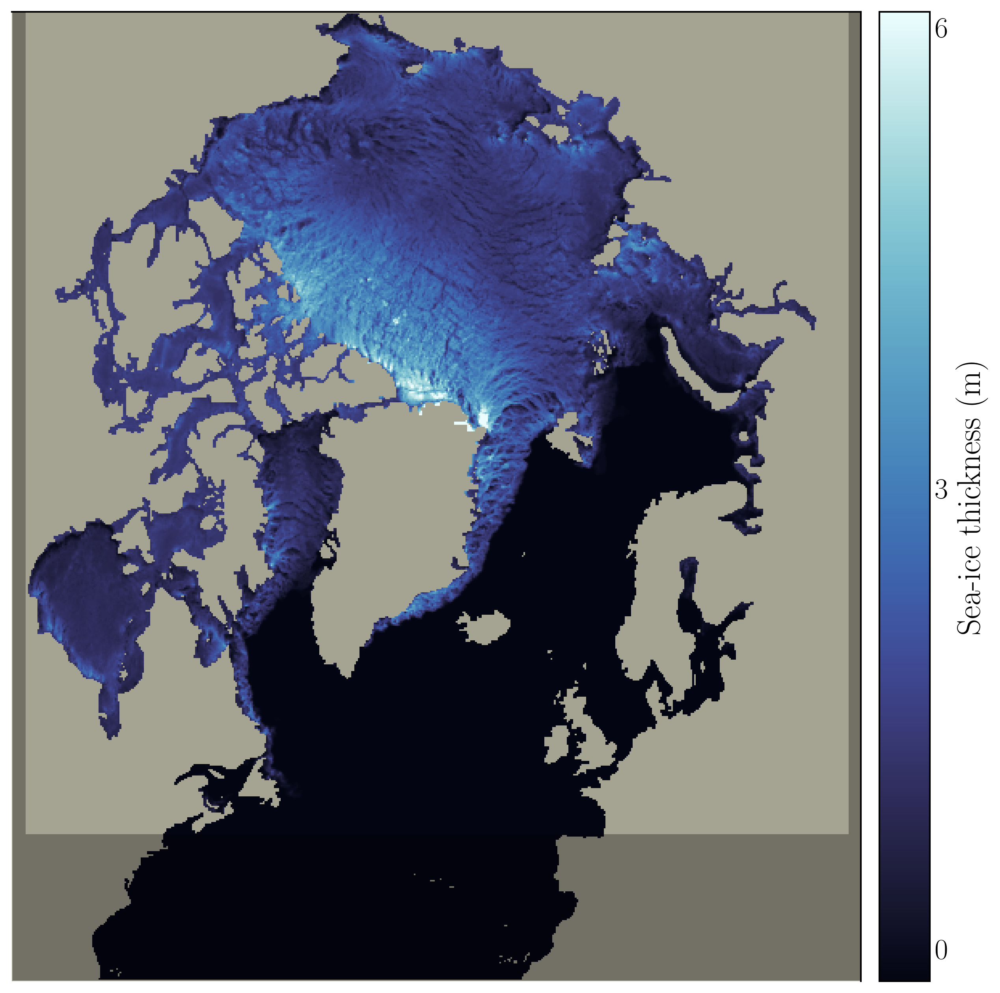

In [137]:
plt.rcParams['axes.facecolor']='xkcd:cement'

fig, ax = plt.subplots(1, 1, figsize=(10.7,8.2), gridspec_kw={'wspace':0.1})
fig.subplots_adjust(left=0.0, right=1, bottom=0, top=1)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.spines.left.set_visible(False)
ax.spines.bottom.set_visible(False)
cmap = colors.LinearSegmentedColormap.from_list('sea_ice', cmocean.cm.ice(np.linspace(0.0, 1.0, 256)))
#ax.text(-3800000, -3250000, str(ds.time.indexes['time'][20])+'\nneXtSIM output', color = 'white', fontsize = 15, ha = 'left')
plt_sit = ax.imshow(ma.masked_array(ds_sit[0], mask = mask_full),cmap=cmap, vmax = 6, vmin = 0, origin = 'lower', alpha = 1)
#plt_sit2 = ax.imshow(ma.masked_array(ds_sit[0,91:,8:-8], mask = 1 - mask),cmap=cmocean.cm.thermal, vmax = 6, vmin = 0, origin = 'lower')
ax.add_patch(
    mpl.patches.Rectangle(xy=[0,0], width=528, height=91,
                    facecolor='black', alpha=0.3)
)
ax.add_patch(
    mpl.patches.Rectangle(xy=[0,91], width=8, height=603-91,
                    facecolor='black', alpha=0.3)
)
ax.add_patch(
    mpl.patches.Rectangle(xy=[0+528-8,91], width=8, height=603-91,
                    facecolor='black', alpha=0.3)
)
#ax.set_ylim(-4000000, 3500000)
#ax.set_xlim(-4500000, 3500000)
cbar_ax2 = fig.add_axes([0.85, 0, 0.04, 1])
norm = mpl.colors.Normalize(vmin=6, vmax=0)
scalar_mappable = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
scalar_mappable.set_array(ds_sit[0])
#cb = ax.figure.colorbar(scalar_mappable, cbar_ax2, ax, ticks = [ 0.1, 3, 5.9])
#cb.outline.set_linewidth(0)
cb =plt.colorbar(scalar_mappable , cax=cbar_ax2, ax =ax, ticks = [ 0.1, 3, 5.9])
cb.set_label('Sea-ice thickness (m)', fontsize = 20)
cb.ax.set_yticklabels(['0', '3', '\>6'], fontsize = 18) 
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig01.png', dpi = 300)

# Results

## short-term forecast
### Fig. 3: constrained surrogate RMSE


In [104]:
# Renormalization process
mean_input = 0.38418264491680904
std_input = 0.771096968092377
def reverse_normalize_input(x):
    return mean_input + x * std_input

#Load images for plots
truth_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_540.npy')
pred_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_540.npy').squeeze()

truth_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_724.npy')
pred_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_724.npy').squeeze()

truth_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_972.npy')
pred_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_972.npy').squeeze()

#Get into unnormalized space
truth_15May = reverse_normalize_input(truth_15May).squeeze()
pred_15May = reverse_normalize_input(pred_15May)

truth_1July = reverse_normalize_input(truth_1July).squeeze()
pred_1July = reverse_normalize_input(pred_1July)

truth_1September = reverse_normalize_input(truth_1September).squeeze()
pred_1September = reverse_normalize_input(pred_1September)


#Load FS and bias error for short-time forecast
fs = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]*ratio_N
fspers = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean_pers.npy')[:,:51]*ratio_N
fs2 = np.load(path_2ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]*ratio_N

bias = np.load(path_1ts_lambda100 +'clip_cycle_1320_bias_mean.npy')[:,:51]*ratio_N
bias2 = np.load(path_2ts_lambda100 +'clip_cycle_1320_bias_mean.npy')[:,:51]*ratio_N


diff_15May_it30 = pred_15May[30] - truth_15May[30]
diff_1July_it30 = pred_1July[30] - truth_1July[30]
diff_1September_it30 = pred_1September[30] - truth_1September[30]

mean_input = 0.38418264491680904
std_input = 0.771096968092377
threshold = 0.1
class_pred_15May = [pred_15May[30]>threshold][0]
class_truth_15May = [truth_15May[30]>threshold][0]

class_pred_1July = [pred_1July[30]>threshold][0]
class_truth_1July = [truth_1July[30]>threshold][0]

class_pred_1September = [pred_1September[30]>threshold][0]
class_truth_1September = [truth_1September[30]>threshold][0]



In [105]:
mean_input = 0.38418264491680904
std_input = 0.771096968092377
mean_output = -1.6270055141928728e-05
std_output = 0.023030024601018818


def reverse_normalize_input(x):
    return mean_input + x * std_input

file_path = path_1ts_lambda100
file_path2 = path_1ts_lambda0

indices = np.arange(0, 1300, step = 120)
tot_sur = np.zeros((len(indices), 60, 512, 512, 1))
tot_sur0 = np.zeros((len(indices), 60, 512, 512, 1))
tot_pers = np.zeros((len(indices), 60, 512, 512))
tot_truth = np.zeros((len(indices), 60, 512, 512))

for i in range(len(indices)):
    tot_sur[i] = np.load(file_path + 'clip_cycle_1320_pred_'+str(indices[i])+'.npy')[:-1]
    tot_sur0[i] = np.load(file_path2 + 'clip_cycle_1320_pred_'+str(indices[i])+'.npy')[:-1]

    tot_truth[i] = np.load(file_path + 'clip_cycle_1320_truth_'+str(indices[i])+'.npy')[:-1]
    tot_pers[i] = np.load(file_path + 'clip_cycle_1320_truth_'+str(indices[i])+'.npy')[0]

tot_sur = tot_sur.reshape((len(indices)*60, 512, 512, 1))
tot_sur0 = tot_sur0.reshape((len(indices)*60, 512, 512, 1))

tot_truth = tot_truth.reshape((len(indices)*60, 512, 512))
tot_pers = tot_pers.reshape((len(indices)*60, 512, 512))

tot_surl100 = reverse_normalize_input(tot_sur)
tot_surl0 = reverse_normalize_input(tot_sur0)

tot_truth = reverse_normalize_input(tot_truth)
tot_pers = reverse_normalize_input(tot_pers)


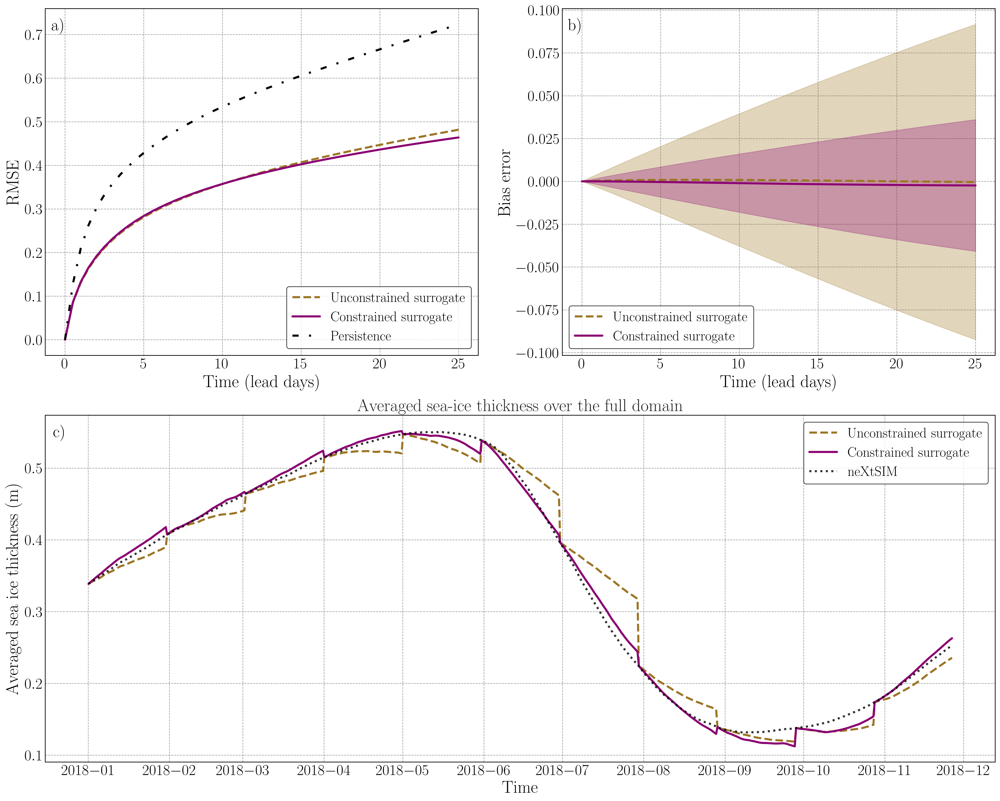

In [106]:
plt.rcParams['axes.facecolor']='white'

fig, axs = plt.subplot_mosaic([['c)', 'd)'], ['e)', 'e)']],
                              constrained_layout=True, figsize = (20,16))

fspers = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean_pers.npy')[:,:51]*ratio_N

fs_l100 = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]*ratio_N
fs_l0 = np.load(path_1ts_lambda0 +'clip_cycle_1320_fs_mean.npy')[:,:51]*ratio_N


lead = np.arange(0,51)
axs['c)'].plot(lead/2,fs_l0.mean(axis = 0), label = 'Unconstrained surrogate', color = dict_color["1_ts_lambda0"], linestyle = 'dashed')

axs['c)'].plot(lead/2,fs_l100.mean(axis = 0), label = 'Constrained surrogate', color = dict_color["1_ts_lambda100"])



axs['c)'].plot(lead/2,fspers.mean(axis = 0), label = 'Persistence', color = 'black', linestyle = (0, (3,5,1,5)))

axs['c)'].set_xlabel("Time (lead days)",fontsize = 25)
axs['c)'].set_ylabel("RMSE",fontsize = 25)
axs['c)'].legend(fontsize = 22)
#axs['c)'].set_title("Averaged forecast skill of surrogate models",fontsize = 25)


fs_l100 = np.load(path_1ts_lambda100 +'clip_cycle_1320_bias_mean.npy')[:,:51]*ratio_N
fs_l0 = np.load(path_1ts_lambda0 +'clip_cycle_1320_bias_mean.npy')[:,:51]*ratio_N


axs['d)'].plot(lead/2,fs_l0.mean(axis = 0), label = 'Unconstrained surrogate', color = dict_color["1_ts_lambda0"], linestyle = 'dashed')
axs['d)'].fill_between(lead/2,fs_l0.mean(axis = 0)-fs_l0.std(axis = 0),
                 fs_l0.mean(axis = 0)+fs_l0.std(axis = 0), 
                 alpha = 0.3, color = dict_color["1_ts_lambda0"])

axs['d)'].plot(lead/2,fs_l100.mean(axis = 0), label = 'Constrained surrogate', color = dict_color["1_ts_lambda100"])
axs['d)'].fill_between(lead/2,fs_l100.mean(axis = 0)-fs_l100.std(axis = 0),
                 fs_l100.mean(axis = 0)+fs_l100.std(axis = 0), 
                 alpha = 0.3, color = dict_color["1_ts_lambda100"])

axs['d)'].set_xlabel("Time (lead days)",fontsize = 25)
axs['d)'].set_ylabel("Bias error",fontsize = 25)
axs['d)'].legend(fontsize = 22)
#axs['d)'].set_title("Averaged bias error of surrogate models",fontsize = 25)


axs['e)'].plot(time[:660],tot_surl0.mean(axis = (1,2)), label = 'Unconstrained surrogate', color = dict_color["1_ts_lambda0"] , linestyle = 'dashed')
axs['e)'].plot(time[:660],tot_surl100.mean(axis = (1,2)), label = 'Constrained surrogate', color = dict_color["1_ts_lambda100"] )
#axs['e)'].plot(time[:660],tot_pers.mean(axis = (1,2)), label = 'Persistence', color = 'black', lw = 1, alpha = 0.8)
axs['e)'].plot(time[:660],tot_truth.mean(axis = (1,2)), label = 'neXtSIM', alpha = 0.8, color = 'k', linestyle = 'dotted')
legend1 = axs['c)'].legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'lower right')
legend2 = axs['d)'].legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'lower left')

legend3 = axs['e)'].legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20)
axs['e)'].set_xlabel('Time',fontsize = 25)
axs['e)'].set_ylabel('Averaged sea ice thickness (m)',fontsize = 25)
axs['e)'].set_title('Averaged sea-ice thickness over the full domain',fontsize = 25)


axs['c)'].tick_params(axis='x', labelsize=22)
axs['d)'].tick_params(axis='x', labelsize=22)
axs['e)'].tick_params(axis='x', labelsize=22)
axs['c)'].tick_params(axis='y', labelsize=22)
axs['d)'].tick_params(axis='y', labelsize=22)
axs['e)'].tick_params(axis='y', labelsize=22)
axs['c)'].text(0.03, 0.95, 'a)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=axs['c)'].transAxes, fontsize = 24)
axs['d)'].text(0.03, 0.95, 'b)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=axs['d)'].transAxes, fontsize = 24)
axs['e)'].text(0.015, 0.95, 'c)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=axs['e)'].transAxes, fontsize = 24)


#axs['e)'].set_xticklabels( time[:660],fontsize=20)
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig03.png', dpi = 300)

### Fig 4: # inputs Surrogate RMSE

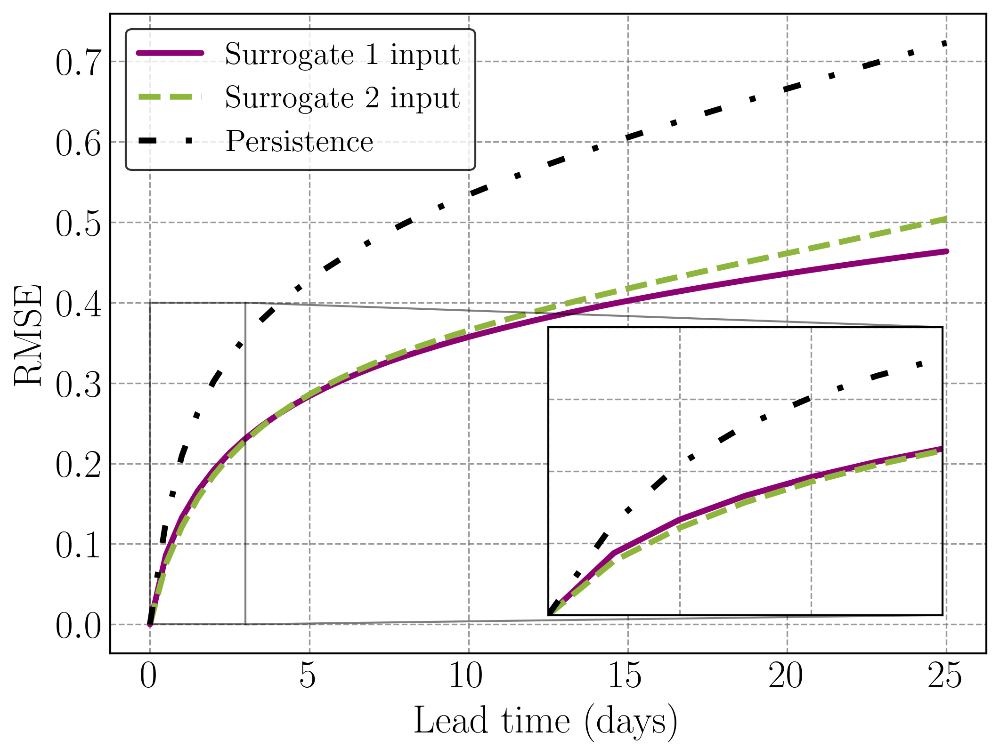

In [107]:
plt.rcParams['axes.facecolor']='white'
mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')
fs = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]*ratio_N
fspers = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean_pers.npy')[:,:51]*ratio_N
fs2 = np.load(path_2ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]*ratio_N

fig, ax7 = plt.subplots(1, 1, figsize = (8, 6))
lead = np.arange(0,51)
im10 = ax7.plot(lead/2,fs.mean(axis = 0), label = 'Surrogate 1 input', color = dict_color["1_ts_lambda100"] )

im10 = ax7.plot(lead/2,fs2.mean(axis = 0), label = 'Surrogate 2 input', color = dict_color["2_ts_lambda100"] , linestyle = 'dashed')

im10 = ax7.plot(lead/2,fspers.mean(axis = 0), label = 'Persistence', color = 'black', linestyle = (0, (3,5,1,5)))

ax7.set_ylabel('RMSE', fontsize = 20)
ax7.set_xlabel('Lead time (days)', fontsize = 20)
ax7.set_xticks(np.arange(0,26, step = 5))
ax7.xaxis.set_tick_params(labelsize=20)
ax7.yaxis.set_tick_params(labelsize=20)

#ax7.legend(fontsize = 20, loc = 'lower right', frame = True)
legend1 = ax7.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  16)

axins = ax7.inset_axes([0.5, 0.06, 0.45, 0.45])
im2 = axins.plot(lead[:10]/2,fs.mean(axis = 0)[:10], color = dict_color["1_ts_lambda100"])
im2 = axins.plot(lead[:10]/2,fs2.mean(axis = 0)[:10], color = dict_color["2_ts_lambda100"], linestyle = 'dashed')
im2 = axins.plot(lead[:10]/2,fspers.mean(axis = 0)[:10], color = 'black', linestyle = (0, (3,5,1,5)))

# subregion of the original image
x1, x2, y1, y2 = 0, 3, 0, 0.4
axins.set_xlim(x1, x2)
axins.set_ylim(y1, y2)
axins.set_xticklabels([])
axins.set_yticklabels([])

ax7.indicate_inset_zoom(axins, edgecolor="black")

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig04.png', dpi = 300)

### Fig 5: Regional RMSE

CONVERT LAT, LON TO CARTESIAN GRID
INTERPOLATE


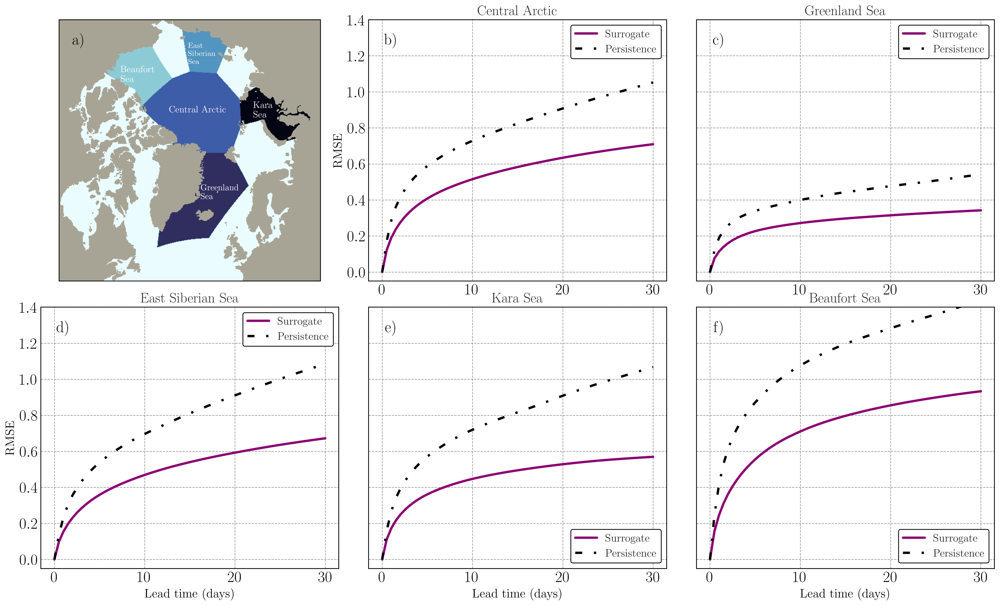

In [109]:
ex = xr.open_dataset('masiemask_ims4km.nc')

lat_source = ds.variables["latitude"][91:, 8:-8]
lon_source = ds.variables["longitude"][91:, 8:-8]

data_name = 'regions'



lat_target2d = ex['lat'].values
lon_target2d = ex['lon'].values


print("CONVERT LAT, LON TO CARTESIAN GRID")
xt, yt, zt = lon_lat_to_cartesian(
            lon_source.values.flatten(), lat_source.values.flatten()
        )
xs, ys, zs = lon_lat_to_cartesian(
            lon_target2d.flatten(), lat_target2d.flatten()
        )

print("INTERPOLATE")
tree = cKDTree(np.column_stack((xs, ys, zs)))
d, inds = tree.query(np.column_stack((xt, yt, zt)), k=1)

mask_region = interpolate(
        ex, data_name, lat_source, d, inds
        )
     
cmap = plt.get_cmap('tab20c')
cmap2 = plt.get_cmap('cmo.ice_r')
mask_region = mask_region['regions'][0]
mask1 = 1*ma.masked_array([mask_region==1][0]*mask, mask = 1-mask)
mask3 = 2*ma.masked_array([mask_region==3][0]*mask, mask =  1-mask)
mask11 = 3*ma.masked_array([mask_region==11][0]*mask, mask = 1-mask)
mask7 = 4*ma.masked_array([mask_region==7][0]*mask, mask = 1-mask)
mask5 = 5*ma.masked_array([mask_region==5][0]*mask, mask =  1-mask)



maskreg = mask1 + mask3 + mask11 + mask7 + mask5

import matplotlib as mpl
mpl.rc('axes',edgecolor='k')
#Color for plotting
cmap_loss = plt.get_cmap('cmo.phase')
colors_loss = cmap_loss(np.linspace(0,1,6)) #get 10 colors along the full range of hsv colormap

name_regions = {}

name_regions['0'] = 'Central Arctic'
name_regions['1'] = 'Greenland Sea'
name_regions['2'] = 'East Siberian Sea'
name_regions['3'] = 'Kara Sea'
name_regions['4'] = 'Beaufort Sea'
name_regions['5'] = 'Baltic Sea'

fig = plt.figure(figsize = (22, 13))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.1)

ax1 = plt.subplot2grid((2, 3), (0, 0))
ax2 = plt.subplot2grid((2, 3), (0, 1))
ax3 = plt.subplot2grid((2, 3), (0, 2))
ax4 = plt.subplot2grid((2, 3), (1, 0))
ax5 = plt.subplot2grid((2, 3), (1, 1))
ax6 = plt.subplot2grid((2, 3), (1, 2))


lead = np.arange(61)


ax1.set_facecolor('xkcd:greyish')

ax1.imshow(ma.masked_array(maskreg, mask = 1-mask), origin = 'lower', cmap = cmap2)

ax1.text(215, 330, 'Central Arctic', color = 'white', fontsize = 12, ha = 'left')
ax1.text(120, 390, 'Beaufort \n     Sea', color = 'white', fontsize = 12, ha = 'left')
ax1.text(277, 160, 'Greenland \n     Sea', color = 'white', fontsize = 11, ha = 'left')
ax1.text(380, 320, 'Kara \n Sea', color = 'white', fontsize = 12, ha = 'left')
ax1.text(252, 425, 'East \n Siberian \n    Sea', color = 'white', fontsize = 10, ha = 'left')


ax1.set_xticks([])
ax1.set_yticks([])

surr = np.load('regions_surr.npy')*ratio_N
pers = np.load('regions_pers.npy')*ratio_N

i = 0 
ax2.plot(lead/2, surr[i].mean(axis = 0), color = dict_color["1_ts_lambda100"], label = 'Surrogate')
ax2.plot(lead/2,pers[i].mean(axis = 0), color = 'black', label = 'Persistence', linestyle = (0, (3,5,1,5)))
ax2.set_title(name_regions[str(i)], fontsize = 18)
ax2.legend(fontsize = 14, facecolor = 'white', edgecolor = 'black', framealpha=1,frameon = True,)
ax2.set_ylim([-0.05, 1.4])
ax2.set_ylabel('RMSE', fontsize = 16)


i = 1 
ax3.plot(lead/2, surr[i].mean(axis = 0), color = dict_color["1_ts_lambda100"], label = 'Surrogate')
ax3.plot(lead/2,pers[i].mean(axis = 0), color = 'black', label = 'Persistence', linestyle = (0, (3,5,1,5)))
ax3.set_title(name_regions[str(i)], fontsize = 18)
ax3.legend(fontsize = 14, facecolor = 'white', edgecolor = 'black', framealpha=1,frameon = True,)
ax3.set_ylim([-0.05, 1.4])
ax3.set_ylabel('RMSE', fontsize = 16)


i = 2
ax4.plot(lead/2, surr[i].mean(axis = 0), color = dict_color["1_ts_lambda100"], label = 'Surrogate')
ax4.plot(lead/2,pers[i].mean(axis = 0), color = 'black', label = 'Persistence', linestyle = (0, (3,5,1,5)))
ax4.set_title(name_regions[str(i)], fontsize = 18)
ax4.legend(fontsize = 14, facecolor = 'white', edgecolor = 'black', framealpha=1,frameon = True,)
ax4.set_ylim([-0.05, 1.4])
ax4.set_xlabel('Lead time (days)', fontsize = 16)
ax4.set_ylabel('RMSE', fontsize = 16)


i = 3 
ax5.plot(lead/2, surr[i].mean(axis = 0), color = dict_color["1_ts_lambda100"], label = 'Surrogate')
ax5.plot(lead/2,pers[i].mean(axis = 0), color = 'black', label = 'Persistence', linestyle = (0, (3,5,1,5)))
ax5.set_title(name_regions[str(i)], fontsize = 18)
ax5.legend(fontsize = 14, facecolor = 'white', edgecolor = 'black', framealpha=1,frameon = True,loc = 'lower right')
ax5.set_ylim([-0.05, 1.4])
ax5.set_xlabel('Lead time (days)', fontsize = 16)
ax5.set_ylabel('RMSE', fontsize = 16)


i = 4 
ax6.plot(lead/2, surr[i].mean(axis = 0), color = dict_color["1_ts_lambda100"], label = 'Surrogate')
ax6.plot(lead/2,pers[i].mean(axis = 0), color = 'black', label = 'Persistence', linestyle = (0, (3,5,1,5)))
ax6.set_title(name_regions[str(i)], fontsize = 18)
ax6.legend(fontsize = 14, facecolor = 'white', edgecolor = 'black', framealpha=1,frameon = True,loc = 'lower right')
ax6.set_ylim([-0.05, 1.4])
ax6.set_xlabel('Lead time (days)', fontsize = 16)
ax6.set_ylabel('RMSE', fontsize = 16)


ax1.text(0.075, 0.92, 'a)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes, fontsize = 20)
ax2.text(0.075, 0.92, 'b)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes, fontsize = 20)
ax3.text(0.075, 0.92, 'c)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax3.transAxes, fontsize = 20)
ax4.text(0.075, 0.92, 'd)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax4.transAxes, fontsize = 20)
ax5.text(0.075, 0.92, 'e)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax5.transAxes, fontsize = 20)
ax6.text(0.075, 0.92, 'f)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax6.transAxes, fontsize = 20)

ax2.tick_params(axis='x', labelsize=20)
ax2.tick_params(axis='y', labelsize=20)
ax3.tick_params(axis='x', labelsize=20)
ax3.tick_params(axis='y', labelsize=20)
ax4.tick_params(axis='x', labelsize=20)
ax4.tick_params(axis='y', labelsize=20)
ax5.tick_params(axis='x', labelsize=20)
ax5.tick_params(axis='y', labelsize=20)
ax6.tick_params(axis='x', labelsize=20)
ax6.tick_params(axis='y', labelsize=20)

ax3.set_ylabel('')
ax5.set_ylabel('')
ax6.set_ylabel('')
ax6.grid(True)
ax6.yaxis.set_ticklabels([])

ax5.grid(True)
ax5.yaxis.set_ticklabels([])

ax3.grid(True)
ax3.yaxis.set_ticklabels([])

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig05.png', dpi = 300)

## Advection
### Fig. 6: advection + trajectories

In [110]:
truth_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_540.npy')
pred_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_540.npy').squeeze()

path = 'Fig2/truth_MIZ.csv'
truth_MIZ = genfromtxt(path, delimiter=',')
x_truth_MIZ = truth_MIZ[1:,2]/1200*512 
y_truth_MIZ = truth_MIZ[1:,1]/1200*512 
x_truth_MIZ = 512-x_truth_MIZ 

path = 'Fig2/pred_MIZ.csv'
pred_MIZ = genfromtxt(path, delimiter=',')
x_pred_MIZ = pred_MIZ[1:,2]/1200*512 
y_pred_MIZ = pred_MIZ[1:,1]/1200*512
x_pred_MIZ = 512-x_pred_MIZ 

path = 'Fig2/truth_1.csv'
truth1 = genfromtxt(path, delimiter=',')
x_truth1 = truth1[1:,2]/1200*512 
y_truth1 = truth1[1:,1]/1200*512  
x_truth1 = 512-x_truth1

path = 'Fig2/pred_1.csv'
pred1 = genfromtxt(path, delimiter=',')
x_pred1 = pred1[1:,2]/1200*512 
y_pred1 = pred1[1:,1]/1200*512 
x_pred1 = 512-x_pred1

path = 'Fig2/truth_2.csv'
truth2 = genfromtxt(path, delimiter=',')
x_truth2 = truth2[1:,2]/1200*512 
y_truth2 = truth2[1:,1]/1200*512 
x_truth2 = 512-x_truth2

path = 'Fig2/pred_2.csv'
pred2 = genfromtxt(path, delimiter=',')
x_pred2 = pred2[1:,2]/1200*512 
y_pred2 = pred2[1:,1]/1200*512 
x_pred2 = 512-x_pred2

path = 'Fig2/truth_3.csv'
truth3 = genfromtxt(path, delimiter=',')
x_truth3 = truth3[1:,2]/1200*512 
y_truth3 = truth3[1:,1]/1200*512 
x_truth3 = 512-x_truth3

path = 'Fig2/pred_3.csv'
pred3 = genfromtxt(path, delimiter=',')
x_pred3 = pred3[1:,2]/1200*512 
y_pred3 = pred3[1:,1]/1200*512 
x_pred3 = 512-x_pred3

path = 'Fig2/truth_4.csv'
truth4 = genfromtxt(path, delimiter=',')
x_truth4 = truth4[1:,2]/1200*512 
y_truth4 = truth4[1:,1]/1200*512 
x_truth4 = 512-x_truth4

path = 'Fig2/pred_4.csv'
pred4 = genfromtxt(path, delimiter=',')
x_pred4 = pred4[1:,2]/1200*512 
y_pred4 = pred4[1:,1]/1200*512 
x_pred4 = 512-x_pred4

truth_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_540.npy')
pred_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_540.npy').squeeze()

truth_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_724.npy')
pred_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_724.npy').squeeze()

truth_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_972.npy')
pred_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_972.npy').squeeze()

truth_15May = reverse_normalize_input(truth_15May).squeeze()
pred_15May = reverse_normalize_input(pred_15May)

truth_1July = reverse_normalize_input(truth_1July).squeeze()
pred_1July = reverse_normalize_input(pred_1July)

truth_1September = reverse_normalize_input(truth_1September).squeeze()
pred_1September = reverse_normalize_input(pred_1September)

threshold = 0.1
class_pred_15May = [pred_15May[50]>threshold][0]
class_truth_15May = [truth_15May[50]>threshold][0]

class_pred_1July = [pred_1July[50]>threshold][0]
class_truth_1July = [truth_1July[50]>threshold][0]

class_pred_1September = [pred_1September[50]>threshold][0]
class_truth_1September = [truth_1September[50]>threshold][0]


<ipython-input-112-6d1829d3bc3e>:48: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS2.collections[0].set_label('neXtSIM SIE')
<ipython-input-112-6d1829d3bc3e>:49: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS.collections[0].set_label('Surrogate SIE')


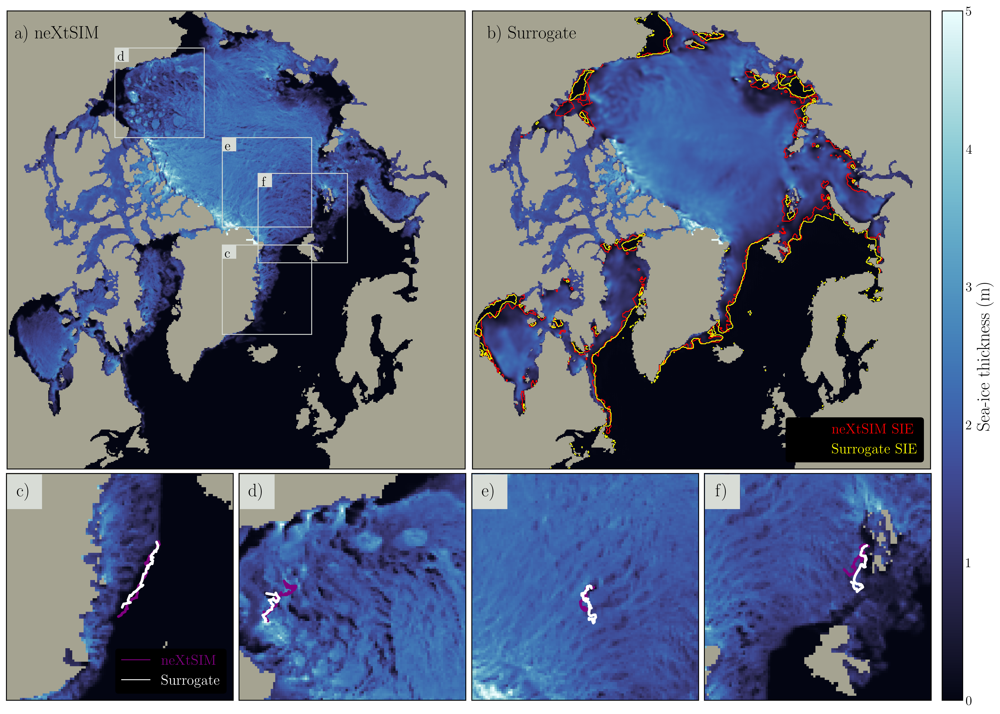

In [112]:
plt.rcParams['axes.facecolor']='xkcd:cement'

fig = plt.figure(figsize = (16, 14.2))
plt.subplots_adjust(left=0, bottom=None, right=None, top=None, wspace=0.02, hspace=0.02)

ax1 = plt.subplot2grid((3, 4), (0, 0), colspan=2, rowspan=2)
ax4 = plt.subplot2grid((3, 4), (0, 2), colspan=2, rowspan=2)
ax5 = plt.subplot2grid((3, 4), (2, 0))
ax6 = plt.subplot2grid((3, 4), (2, 1))
ax7 = plt.subplot2grid((3, 4), (2, 2))
ax8 = plt.subplot2grid((3, 4), (2, 3))

#ax5 = plt.subplot2grid((5, 3), (2, 1))
ax1.grid(False)
ax4.grid(False)
ax5.grid(False)
ax6.grid(False)
ax7.grid(False)
ax8.grid(False)

ax1.set_xticks([])
ax4.set_xticks([])
ax5.set_xticks([])
ax6.set_xticks([])
ax7.set_xticks([])
ax8.set_xticks([])
ax1.set_yticks([])
ax2.set_yticks([])
ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])
X, Y = np.arange(512), np.arange(512)
im1 = ax1.imshow(ma.masked_array(truth_15May[50], mask = 1- mask), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)
im4 = ax4.imshow(ma.masked_array(pred_15May[50], mask = 1- mask), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)
l, b, h, w = .27, .416, .17, .17
im5 = ax5.imshow(ma.masked_array(truth_15May[0,150:250,240:340], mask = 1- mask[150:250,240:340]), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)
im6 = ax6.imshow(ma.masked_array(truth_15May[0,370:470,120:220], mask = 1- mask[370:470,120:220]), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)
im7 = ax7.imshow(ma.masked_array(truth_15May[0,270:370,240:340], mask = 1- mask[270:370,240:340]), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)
im8 = ax8.imshow(ma.masked_array(truth_15May[0,230:330,280:380], mask = 1- mask[230:330,280:380]), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)



CS2 = ax4.contour(X, Y, ma.masked_array(class_truth_15May, mask = 1 - mask), colors = 'red', linewidths = 1, alpha= 1)
CS = ax4.contour(X, Y, ma.masked_array(class_pred_15May, mask = 1 - mask), colors = 'yellow', linewidths = 1)
CS2.collections[0].set_label('neXtSIM SIE')
CS.collections[0].set_label('Surrogate SIE')

ax1.add_patch(plt.Rectangle((240,150), 100, 100, alpha=1, facecolor='none', edgecolor = 'xkcd:light grey', linewidth = 1))
ax1.add_patch(plt.Rectangle((120,370), 100, 100, alpha=1, facecolor='none', edgecolor = 'xkcd:light grey', linewidth = 1))
ax1.add_patch(plt.Rectangle((240,270), 100, 100, alpha=1, facecolor='none', edgecolor = 'xkcd:light grey', linewidth = 1))
ax1.add_patch(plt.Rectangle((280,230), 100, 100, alpha=1, facecolor='none', edgecolor = 'xkcd:light grey', linewidth = 1))

ax1.add_patch(plt.Rectangle((240,150+85), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))
ax1.add_patch(plt.Rectangle((120,370+85), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))
ax1.add_patch(plt.Rectangle((240,270+85), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))
ax1.add_patch(plt.Rectangle((280,230+85), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))

ax1.text(243, 236, 'c', fontsize = 15, color = 'xkcd:black')
ax1.text(123, 456, 'd', fontsize = 15, color = 'xkcd:black')
ax1.text(243, 356, 'e', fontsize = 15, color = 'xkcd:black')
ax1.text(284, 316, 'f', fontsize = 15, color = 'xkcd:black')

ax5.plot(y_truth_MIZ - 240, x_truth_MIZ-150,  color = 'purple', label = 'neXtSIM')
ax5.plot(y_pred_MIZ- 240, x_pred_MIZ-150, color = 'white', label = 'Surrogate')
ax6.plot(y_truth1 - 120, x_truth1-370, color = 'purple')
ax6.plot(y_pred1- 120, x_pred1-370, color = 'white')
ax7.plot(y_truth2 - 240, x_truth2-270,  color = 'purple')
ax7.plot(y_pred2- 240, x_pred2-270, color = 'white')
ax8.plot(y_truth3 - 280, x_truth3-230,  color = 'purple')
ax8.plot(y_pred3- 280, x_pred3-230, color = 'white')
#ax8.plot(y_truth1 - 280, x_truth1-370, color = 'white')
#ax8.plot(y_pred1- 280, x_pred1-370, color = 'yellow')
legend5=ax5.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['purple','white'], fontsize=16, loc = 'lower right')
frame5= legend5.get_frame()
frame5.set_color('black')
for line in legend5.get_lines():
    line.set_linewidth(1.0)

#ax1.text(10, 480, 'neXtSIM', fontsize = 20)
#ax4.text(10, 480, 'Surrogate', fontsize = 20)

ax1.text(0.11, 0.95, 'a) neXtSIM', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes, fontsize = 20)
ax4.text(0.13, 0.95, 'b) Surrogate', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax4.transAxes, fontsize = 20)
ax5.text(0.075, 0.92, 'c)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax5.transAxes, fontsize = 20)
ax6.text(0.075, 0.92, 'd)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax6.transAxes, fontsize = 20)
ax7.text(0.075, 0.92, 'e)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax7.transAxes, fontsize = 20)
ax8.text(0.075, 0.92, 'f)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax8.transAxes, fontsize = 20)
ax5.add_patch(plt.Rectangle((0,84), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))
ax6.add_patch(plt.Rectangle((0,84), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))
ax7.add_patch(plt.Rectangle((0,84), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))
ax8.add_patch(plt.Rectangle((0,84), 15, 15, alpha=1, facecolor='xkcd:light grey', edgecolor = 'xkcd:light grey', linewidth = 1))


legend3 = ax4.legend(markerscale = 1, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=16, loc = 'lower right')
frame3 = legend3.get_frame()
frame3.set_color('black')
for line in legend3.get_lines():
    line.set_linewidth(1.0)

cbar_ax2 = fig.add_axes([0.91, 0.125, 0.02,0.755])

cb = fig.colorbar(im1,ax =[ax4, ax8], cax=cbar_ax2, aspect= 18.5, pad = 0)
cb.ax.tick_params(labelsize=15)
cb.set_label('Sea-ice thickness (m)', fontsize = 20)

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig06.png', dpi = 300)

## Diffusion

### Fig 7: smoothing features

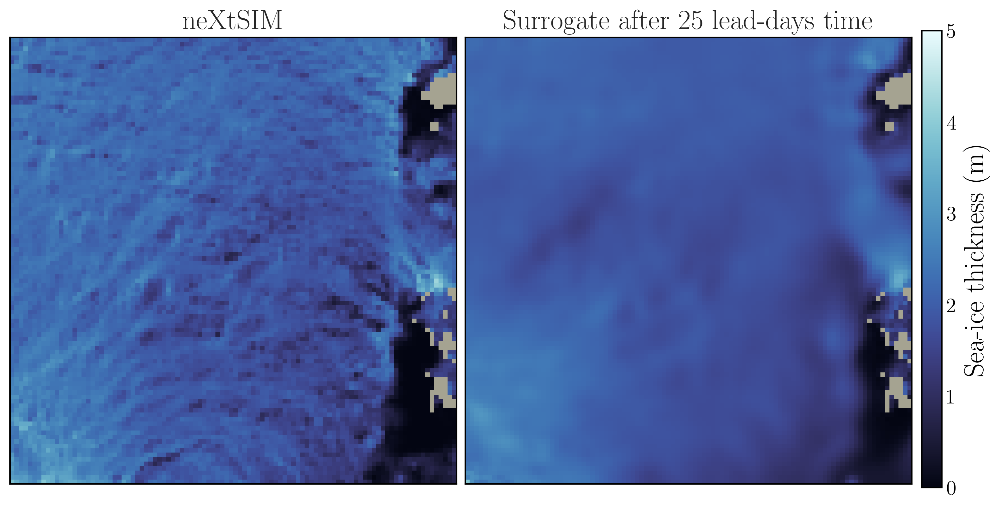

In [113]:
fig = plt.figure(figsize = (10,6))
plt.subplots_adjust(left=0, bottom=None, right=None, top=None, wspace=0.02, hspace=0.02)

ax1 = plt.subplot2grid((1, 2), (0, 0))
ax2 = plt.subplot2grid((1, 2), (0, 1))
ax1.grid(False)
ax2.grid(False)

ax1.set_xticks([])
ax2.set_xticks([])

ax1.set_yticks([])
ax2.set_yticks([])
ax1.set_title('neXtSIM', fontsize = 20)
ax2.set_title('Surrogate after 25 lead-days time', fontsize = 20)

im1 = ax1.imshow(ma.masked_array(truth_15May[50,270:370,260:360], mask = 1- mask[270:370,260:360]), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)

plt.subplot(122)
plt.grid(False)
im2 = ax2.imshow(ma.masked_array(pred_15May[50,270:370,260:360], mask = 1- mask[270:370,260:360]), cmap = cmocean.cm.ice, origin = 'lower', vmin = 0, vmax = 5)
cbar_ax2 = fig.add_axes([0.91, 0.125, 0.02,0.76])

cb = fig.colorbar(im1,ax =[ax2], cax=cbar_ax2, aspect= 18.5, pad = 0)
cb.ax.tick_params(labelsize=15)
cb.set_label('Sea-ice thickness (m)', fontsize = 20)

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig07.png', dpi = 300)

### Fig 8: PSD analysis

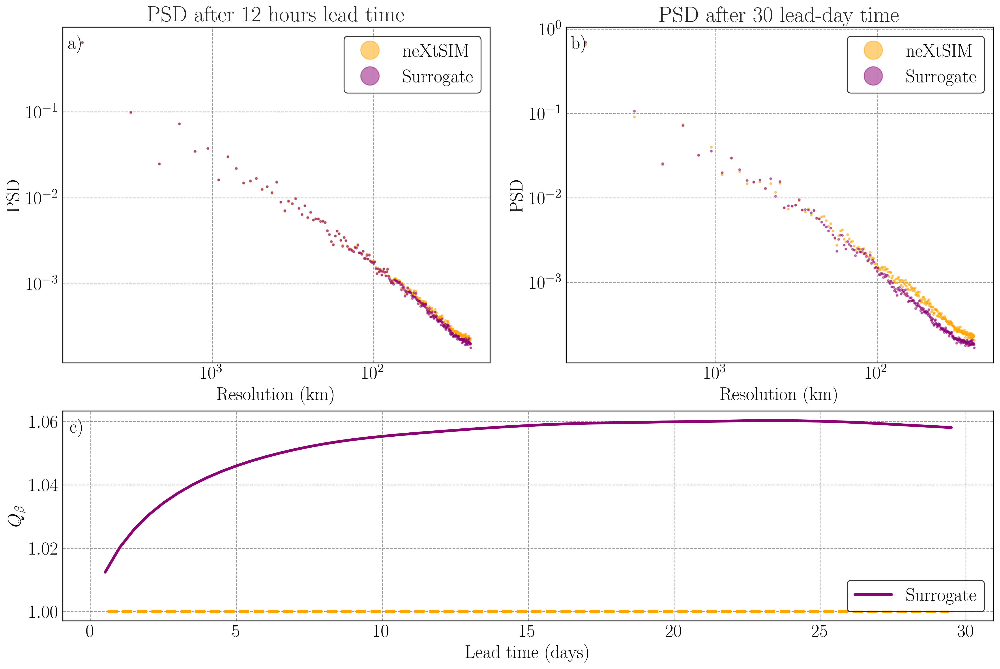

In [150]:
from IPython.display import display, Latex
Nres = 256
N_pixel = np.arange(1, Nres//2, 1)
Res = 25
x = np.arange(1,257)
plt.rcParams['axes.facecolor']='white'

resolution = 1/x*Nres*Res
ll = np.load(path_1ts_lambda100 + 'cycle_1320_PSD_tot_truth.npy')
ll100 = np.load(path_1ts_lambda100 + 'cycle_1320_PSD_tot_surr.npy')

score_1320 = np.load(path_1ts_lambda0 + 'cycle_1320_PSD_coef_tot_surr.npy')[:,:60]
score_1320_t1 = np.load(path_1ts_lambda0 + 'cycle_1320_PSD_coef_tot_truth.npy')[:,:60]

score_1320_t2 = np.load(path_1ts_lambda100 + 'cycle_1320_PSD_coef_tot_truth.npy')[:,:60]
score_1320_cons = np.load(path_1ts_lambda100 + 'cycle_1320_PSD_coef_tot_surr.npy')[:,:60]
#score_1320_2_2 = np.load('17Fev23/lambda100/UNet2_2input_2output/cycle_1320_PSD_coef_tot_surr.npy')

ratio1 = (score_1320/score_1320_t1).mean(axis = 0)
ratio_cons = (score_1320_cons/score_1320_t2).mean(axis = 0)

alpha = 2*(1 + 1*(216)/np.sum(np.log(ll100[:,:,20:-20:]/(ll100[:,:,20]).reshape(1320,59,1)), axis = 2))
#alpha = alpha[:,1:]
alpha_truth = 2*(1 + 1*(216)/np.sum(np.log(ll[:,:,20:-20:]/(ll[:,:,20]).reshape(1320,59,1)), axis = 2))

ratio = (alpha/alpha_truth).mean(axis = 0) 
fig, axs = plt.subplot_mosaic([['a)', 'd)'], ['e)','e)']], gridspec_kw = {"wspace":0.02, "hspace":0.02, "height_ratios":[.8,0.5]},
                              constrained_layout=True, figsize = (15,10))

axs['a)'].loglog(resolution,ll[200, 1],'.', alpha = 0.5, label = 'neXtSIM', ms = 4, color='orange')
axs['a)'].loglog(resolution,ll100[200, 1],'.', color = dict_color["1_ts_lambda100"], alpha = 0.5, label = 'Surrogate', ms = 4)
axs['a)'].invert_xaxis()


axs['a)'].set_xlabel('Resolution (km)', fontsize = 20)
axs['a)'].set_ylabel('PSD', fontsize = 20)
legend1 = axs['a)'].legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'upper right')
axs['a)'].set_title('PSD after 12 hours lead time', fontsize = 24)





axs['d)'].loglog(resolution,ll[200,58],'.', alpha = 0.5, label = 'neXtSIM', ms = 4, color='orange')
axs['d)'].loglog(resolution,ll100[200,58],'.', color = dict_color["1_ts_lambda100"], alpha = 0.5, label = 'Surrogate', ms = 4)


axs['d)'].invert_xaxis()


axs['d)'].set_xlabel('Resolution (km)', fontsize = 20)
axs['d)'].set_ylabel('PSD', fontsize = 20)
legend1 = axs['d)'].legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'upper right')
axs['d)'].set_title('PSD after 30 lead-day time', fontsize = 24)

time4 = np.arange(60)/2

a = r'Q_{\beta}'
axs['e)'].plot(time4[1:], ratio, label = 'Surrogate', color = dict_color["1_ts_lambda100"])
legend1 = axs['e)'].legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'lower right')
axs['e)'].set_ylabel('$%s$' %a, fontsize = 20)
axs['e)'].set_xlabel('Lead time (days)', fontsize = 20)
axs['e)'].axhline(1, xmin = 0.048, xmax = 1 - 0.048, color='orange', linestyle = 'dashed')
axs['e)'].tick_params(axis='x', labelsize=20)
axs['e)'].tick_params(axis='y', labelsize=20)

axs['a)'].tick_params(axis='x', labelsize=20)
axs['a)'].tick_params(axis='y', labelsize=20)
axs['d)'].tick_params(axis='x', labelsize=20)
axs['d)'].tick_params(axis='y', labelsize=20)

axs['a)'].text(0.03, 0.95, 'a)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=axs['a)'].transAxes, fontsize = 20)
axs['d)'].text(0.03, 0.95, 'b)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=axs['d)'].transAxes, fontsize = 20)
axs['e)'].text(0.015, 0.92, 'c)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=axs['e)'].transAxes, fontsize = 20)

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig08.png', dpi = 300)

## Long time

### Fig. 9: Seasonal forecast RMSE

In [27]:
TIME_PATH = './time_test_2006_2009.npy'

time = np.load(TIME_PATH, allow_pickle = True)

N = np.shape(time)[0]
new_time = []
for n in range(N):
    new_time.append(datetime.strptime(str(time[n])[:19],'%Y-%m-%dT%H:%M:%S').strftime("%y-%m-%d"))


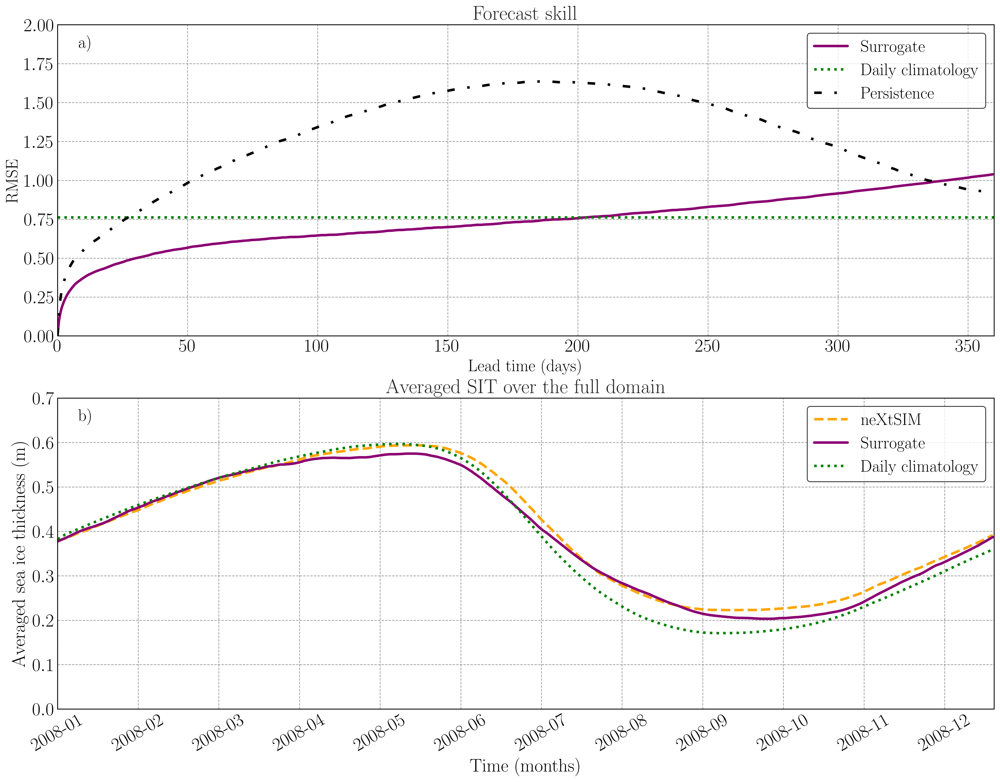

In [167]:
mean_input = 0.38418264491680904
std_input = 0.771096968092377
mean_output = -1.6270055141928728e-05
std_output = 0.023030024601018818


def reverse_normalize_input(x):
    return mean_input + x * std_input
clim2 = np.load("climatology_after_norm.npy")
clim = np.load("climatology_before_norm.npy")
#fs_longlambda0 = "UNet_lambda100_mu0_nu0/before_cycle_18_fs_mean.npy"
fs_longlambda100 = np.load(path_1ts_lambda100 + "before_cycle_25_fs_mean.npy")*ratio_N
fs_longpers = np.load(path_1ts_lambda100 + "before_cycle_25_fs_mean_pers.npy")*ratio_N

im1 = np.load(path_1ts_lambda100 + "clip_cycle_1_truth_0.npy")
im2 = np.load(path_1ts_lambda100 + "before_cycle_25_truth_24.npy")

im3 = np.load(path_1ts_lambda100 + "before_cycle_25_pred_24.npy")
im5 = np.load(path_1ts_lambda100 + "before_cycle_25_pred_24.npy")
mpl.rc('axes',edgecolor='k')

time2 = np.arange(1100)
truth= reverse_normalize_input(im2)
NN100 = reverse_normalize_input(im3)
NN2006 = reverse_normalize_input(im5)
def rmse(x, y) :
    return np.sqrt( np.mean( (x - y)**2, axis = (1, 2)))
plt.rcParams['axes.facecolor']='white'

time3 = []
for n in range(62,720+62,62):
    ew = new_time[720*4+2*n]
    ex = datetime.strptime(str(ew),'%y-%m-%d').strftime("%Y-%m")
    time3.append(ex)
N = np.arange(720)
fig  = plt.figure(figsize = (20,15))
mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')
def get_axis_limits(ax, scale=1):
    return ax.get_xlim()[0]*scale, ax.get_ylim()[1]*scale 

ax = fig.add_subplot(211)

ax.spines['left'].set_color('k')        # setting up Y-axis tick color to red
ax.spines['top'].set_color('k')
ax.spines['right'].set_color('k')        # setting up Y-axis tick color to red
ax.spines['bottom'].set_color('k')
plt.plot(N/2, fs_longlambda100.mean(axis = 0), label = 'Surrogate', color = dict_color["1_ts_lambda100"])
plt.xticks(fontsize = 22)
ax.text(0.03, 0.94, 'a)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize = 20)

plt.yticks(fontsize = 22)
plt.hlines(rmse(clim2[:360,:,:,0] ,im1[::2]).mean(axis = 0)*ratio_N, 0, 360, label = 'Daily climatology', color = 'green', linestyle = 'dotted')
plt.plot(N/2, fs_longpers.mean(axis = 0), label = 'Persistence', color = 'black', linestyle = (0, (3,5,1,5)))
#plt.xticks(ticks = N[::60] ,labels = time3, rotation = 30,fontsize = 15)
plt.xlabel('Lead time (days)', fontsize = 20)
plt.ylim([0,2.])
plt.xlim([0, 360])
legend1 = ax.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'upper right')
plt.ylabel('RMSE', fontsize = 20)
plt.title('Forecast skill', fontsize  = 24)

ax = fig.add_subplot(212)

ax.spines['left'].set_color('k')        # setting up Y-axis tick color to red
ax.spines['top'].set_color('k')
ax.spines['right'].set_color('k')        # setting up Y-axis tick color to red
ax.spines['bottom'].set_color('k')
ax.text(0.03, 0.94, 'b)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize = 20)

plt.plot(N,truth.mean(axis = (1, 2)), label = 'neXtSIM', color = 'orange', linestyle = 'dashed')
plt.plot(N,NN100.mean(axis = (1, 2)), label = 'Surrogate', color = dict_color["1_ts_lambda100"] )

plt.plot(N[::2], clim[:360,:,:,0].mean(axis = (1, 2)), label = 'Daily climatology', color = 'green', linestyle='dotted')
legend1 = ax.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  20, loc = 'upper right')
plt.xlim([0, 720])
plt.ylim([0, 0.7])
plt.xticks(fontsize = 22)
plt.yticks(fontsize = 22)
plt.xlabel('Time (months)', fontsize = 22)
plt.ylabel('Averaged sea ice thickness (m)', fontsize = 22)
plt.title('Averaged SIT over the full domain', fontsize = 24)
plt.xticks(ticks = N[::62] ,labels = time3, rotation = 30,fontsize = 22)
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig09.png', dpi = 300)


### Fig 10 SIE accuracy

In [119]:
time = np.load('time_test_2006_2009.npy', allow_pickle = True)

N = np.shape(time)[0]
time_before = []
for n in range(N):
    time_before.append(datetime.strptime(str(time[n])[:19],'%Y-%m-%dT%H:%M:%S').strftime("%y-%m-%d"))
index_begin = np.zeros((25, 720))
N = np.arange(60*25+720)
for i in range(25):
    for j in range(720):
        index_begin[i, j] = int(time_before[(i*120 + j*2)][3:5])
array = np.load("acc_25.npy")
array3 = np.load("acc_pers_25.npy")

array2 = np.zeros((25, 12))
array4 = np.zeros((25, 12))

for i in range(25):
    for j in range(12):
        array2[i, j] = np.mean(array[i,j*60:(j+1)*60])
        array4[i, j] = np.mean(array3[i,j*60:(j+1)*60])
#plt.figure(figsize = (10,10))
#seaborn.heatmap(array, annot = True, cmap = cmocean.cm.thermal)
dict_date = {}
dict_date["1"]=np.mean(array2[index_begin[:,0]==1], axis = 0)
dict_date["2"]=np.mean(array2[index_begin[:,0]==2], axis = 0)
dict_date["3"]=np.mean(array2[index_begin[:,0]==3], axis = 0)
dict_date["4"]=np.mean(array2[index_begin[:,0]==4], axis = 0)
dict_date["5"]=np.mean(array2[index_begin[:,0]==5], axis = 0)
dict_date["6"]=np.mean(array2[index_begin[:,0]==6], axis = 0)
dict_date["7"]=np.mean(array2[index_begin[:,0]==7], axis = 0)
dict_date["8"]=np.mean(array2[index_begin[:,0]==8], axis = 0)
dict_date["9"]=np.mean(array2[index_begin[:,0]==9], axis = 0)
dict_date["10"]=np.mean(array2[index_begin[:,0]==10], axis = 0)
dict_date["11"]=np.mean(array2[index_begin[:,0]==11], axis = 0)
dict_date["12"]=np.mean(array2[index_begin[:,0]==12], axis = 0)

dict_date2 = {}
dict_date2["1"]=np.mean(array4[index_begin[:,0]==1], axis = 0)
dict_date2["2"]=np.mean(array4[index_begin[:,0]==2], axis = 0)
dict_date2["3"]=np.mean(array4[index_begin[:,0]==3], axis = 0)
dict_date2["4"]=np.mean(array4[index_begin[:,0]==4], axis = 0)
dict_date2["5"]=np.mean(array4[index_begin[:,0]==5], axis = 0)
dict_date2["6"]=np.mean(array4[index_begin[:,0]==6], axis = 0)
dict_date2["7"]=np.mean(array4[index_begin[:,0]==7], axis = 0)
dict_date2["8"]=np.mean(array4[index_begin[:,0]==8], axis = 0)
dict_date2["9"]=np.mean(array4[index_begin[:,0]==9], axis = 0)
dict_date2["10"]=np.mean(array4[index_begin[:,0]==10], axis = 0)
dict_date2["11"]=np.mean(array4[index_begin[:,0]==11], axis = 0)
dict_date2["12"]=np.mean(array4[index_begin[:,0]==12], axis = 0)

vals = np.array(list(dict_date.values()))
vals2 = np.array(list(dict_date2.values()))


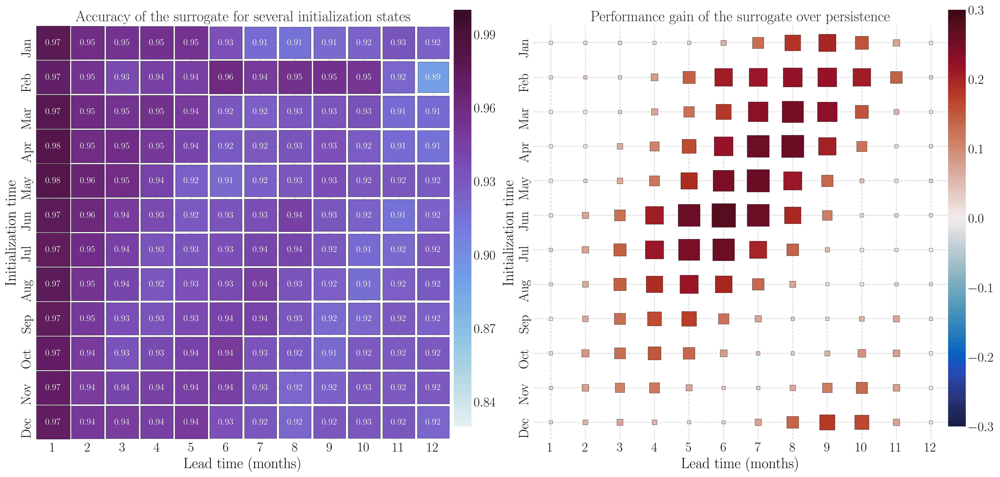

In [120]:
plt.rcParams['axes.facecolor']='xkcd:white'
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (22, 12))

plt.subplot(121)
cellsize_vmax = 1
cbar_width = 0.05 * 6.0 / 20
title = 'Accuracy of the surrogate for several initialization states'

array =vals 

cbar_ax1 = f.add_axes([0.48, 0.2, cbar_width, 0.65])

heatmap2(array, title = title, ax=ax1, cbar_ax=cbar_ax1, 
             vmax=1, vmin = 0.83, cmap=cmocean.cm.dense, annot=array, fmt="d", annot_kws={"fontsize":"large", "color":"white"},
             cellsize=np.abs(array), cellsize_vmax=cellsize_vmax, rect_kws = {'edgecolor': "black", 'lw':0.3},
             square=True)


plt.subplot(122)
array = vals-vals2
cellsize_vmax = 0.4
cbar_width = 0.05 * 6.0 / 20
title = 'Performance gain of the surrogate over persistence'
cbar_ax2 = f.add_axes([0.9, 0.2, cbar_width, 0.65])

heatmap2(array, title = title, ax=ax2, cbar_ax=cbar_ax2, 
             vmax=0.3, vmin = -0.3, cmap=cmocean.cm.balance, annot=False, fmt="s", annot_kws={"fontsize":"large"},
             cellsize=np.abs(array), cellsize_vmax=cellsize_vmax, rect_kws = {'edgecolor': "black", 'lw':0.3},
             square=True)



plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig10.png', dpi = 300)


# Fig Appendix: 
## SIE definition


In [121]:
sic = ds.sic.data
sit = ds.sit.data
R_tot = np.zeros((124, 3000))
for i in range(124):
    R = sit[i][[0.15<sic[i]][0]*[sic[i]<0.8][0]]
    R_tot[i,:np.shape(R)[0]] = R[i]
R_nonzeros = R_tot[np.nonzero(R_tot > 0)]


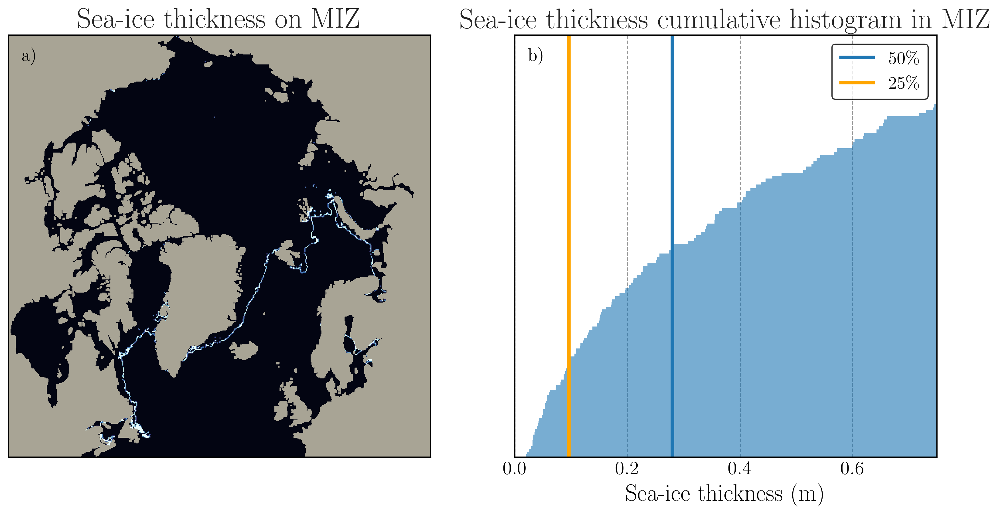

In [124]:
mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')


fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 8))
ax1.grid(False)
ax1.imshow(ma.masked_array([0.15<sic[0,91:,8:-8]][0]*[sic[0,91:,8:-8]<0.8][0], mask = 1 - mask), cmap = cmocean.cm.ice, origin = "lower")
ax1.set_facecolor(color = 'xkcd:greyish')
ax1.set_xticks([])
ax1.set_yticks([])
ax1.text(0.05, 0.95, 'a)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes, fontsize = 15)

ax1.set_title('Sea-ice thickness on MIZ')
ax2.hist(R_nonzeros, bins = 100000, alpha = 0.6, cumulative=True)
mean = np.mean(R_nonzeros)
ax2.vlines(mean, 0, 1000000, label = '$50\%$')
ax2.vlines(np.percentile(R_nonzeros, 25), 0, 1000000, color = 'orange', label = '$25 \%$')
ax2.legend()
ax2.text(0.05, 0.95, 'b)', color = 'black', horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes, fontsize = 15)

ax2.set_facecolor(color = 'white')

ax2.set_xlim([0, 0.75])
ax2.set_ylim([0, 270000])
ax2.set_yticks([])
asp = np.diff(ax2.get_xlim())[0] / np.diff(ax2.get_ylim())[0]
ax2.set_aspect(asp)
ax2.set_title('Sea-ice thickness cumulative histogram in MIZ')
ax2.set_xlabel('Sea-ice thickness (m)')


legend1 = ax2.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  15, loc = 'upper right')

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig11.png', dpi = 300)


## Training
### Training losses

In [126]:
loss_1ts_lambda0 = np.load(path_1ts_lambda0 +'loss.npy')
loss_2ts_lambda0 = np.load(path_2ts_lambda0+'loss.npy')

val_loss_1ts_lambda0 = np.load(path_1ts_lambda0 +'val_local_loss.npy')
val_loss_2ts_lambda0 = np.load(path_2ts_lambda0 +'val_local_loss.npy')

local_1ts_lambda0 = np.load(path_1ts_lambda0 +'local_loss.npy')
local_2ts_lambda0 = np.load(path_2ts_lambda0+'local_loss.npy')

val_local_1ts_lambda0 = np.load(path_1ts_lambda0 +'val_local_loss.npy')
val_local_2ts_lambda0 = np.load(path_2ts_lambda0 +'val_local_loss.npy')

global_1ts_lambda0 = np.load(path_1ts_lambda0 +'global_loss.npy')
global_2ts_lambda0 = np.load(path_2ts_lambda0 +'global_loss.npy')

val_global_1ts_lambda0 = np.load(path_1ts_lambda0 +'val_global_loss.npy')
val_global_2ts_lambda0 = np.load(path_2ts_lambda0 +'val_global_loss.npy')

loss_1ts_lambda100 = np.load(path_1ts_lambda100 +'loss.npy')
loss_2ts_lambda100 = np.load(path_2ts_lambda100+'loss.npy')

val_loss_1ts_lambda100 = np.load(path_1ts_lambda100 +'val_loss.npy')
val_loss_2ts_lambda100 = np.load(path_2ts_lambda100 +'val_loss.npy')

local_1ts_lambda100 = np.load(path_1ts_lambda100 +'local_loss.npy')
local_2ts_lambda100 = np.load(path_2ts_lambda100+'local_loss.npy')

val_local_1ts_lambda100 = np.load(path_1ts_lambda100 +'val_local_loss.npy')
val_local_2ts_lambda100 = np.load(path_2ts_lambda100 +'val_local_loss.npy')

global_1ts_lambda100 = np.load(path_1ts_lambda100 +'global_loss.npy')
global_2ts_lambda100 = np.load(path_2ts_lambda100 +'global_loss.npy')

val_global_1ts_lambda100 = np.load(path_1ts_lambda100 +'val_global_loss.npy')
val_global_2ts_lambda100 = np.load(path_2ts_lambda100 +'val_global_loss.npy')

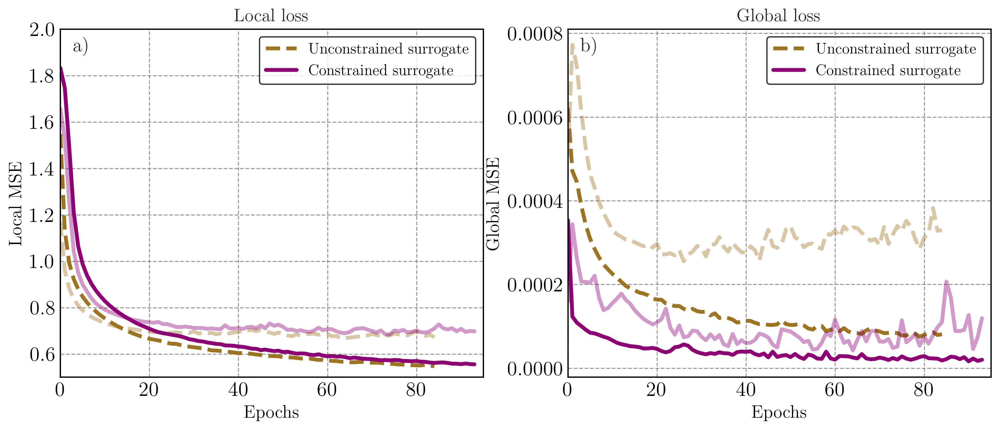

In [127]:
# plot loss
plt.rcParams['axes.facecolor']='white'

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (13, 5))

ax1.plot(loss_1ts_lambda0, label = 'Unconstrained surrogate', color = dict_color["1_ts_lambda0"], linestyle = 'dashed')
ax1.plot(val_loss_1ts_lambda0, color = dict_color["1_ts_lambda0"], alpha = 0.4, linestyle = 'dashed')

ax1.plot(loss_1ts_lambda100, label = 'Constrained surrogate', color = dict_color["1_ts_lambda100"])
ax1.plot(val_loss_1ts_lambda100, color = dict_color["1_ts_lambda100"], alpha = 0.4)

ax1.set_ylim([0.5, 2])
ax1.set_xlim([0, len(val_loss_1ts_lambda100)+1])
ax1.legend(fontsize = 14)
ax1.text(0.05, 0.95, 'a)', horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes, fontsize = 15)


ax2.plot(global_1ts_lambda0, label = 'Unconstrained surrogate', color = dict_color["1_ts_lambda0"], linestyle = 'dashed')
ax2.plot(val_global_1ts_lambda0, color = dict_color["1_ts_lambda0"], alpha = 0.4, linestyle = 'dashed')

ax2.plot(global_1ts_lambda100, label = 'Constrained surrogate', color = dict_color["1_ts_lambda100"])
ax2.plot(val_global_1ts_lambda100, color = dict_color["1_ts_lambda100"], alpha = 0.4)

ax2.set_xlim([0, len(val_loss_1ts_lambda100)+1])
ax2.legend(fontsize = 14)
ax2.text(0.05, 0.95, 'b)', horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes, fontsize = 15)

ax1.set_xlabel("Epochs", fontsize = 14)
ax1.set_ylabel("Local MSE",fontsize = 14)
ax2.set_xlabel("Epochs",fontsize = 14)
ax2.set_ylabel("Global MSE",fontsize = 14)


ax1.set_title("Local loss",fontsize = 14)
ax2.set_title("Global loss",fontsize = 14)
legend1 = ax1.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  12, loc = 'upper right')
legend1 = ax2.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  12, loc = 'upper right')

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig12.png', dpi = 300)


## Surrogate model
### Surrogate after 5 lead days

<ipython-input-132-9ead46456f1c>:83: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS2.collections[0].set_label('neXtSIM SIE')
<ipython-input-132-9ead46456f1c>:84: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS.collections[0].set_label('surrogate SIE')
<ipython-input-132-9ead46456f1c>:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS4.collections[0].set_label('neXtSIM SIE')
<ipython-input-132-9ead46456f1c>:91: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  C3.collections[0].set_label('surrogate SIE')
<ipython-input-132-9ead46456f1c>:97: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 

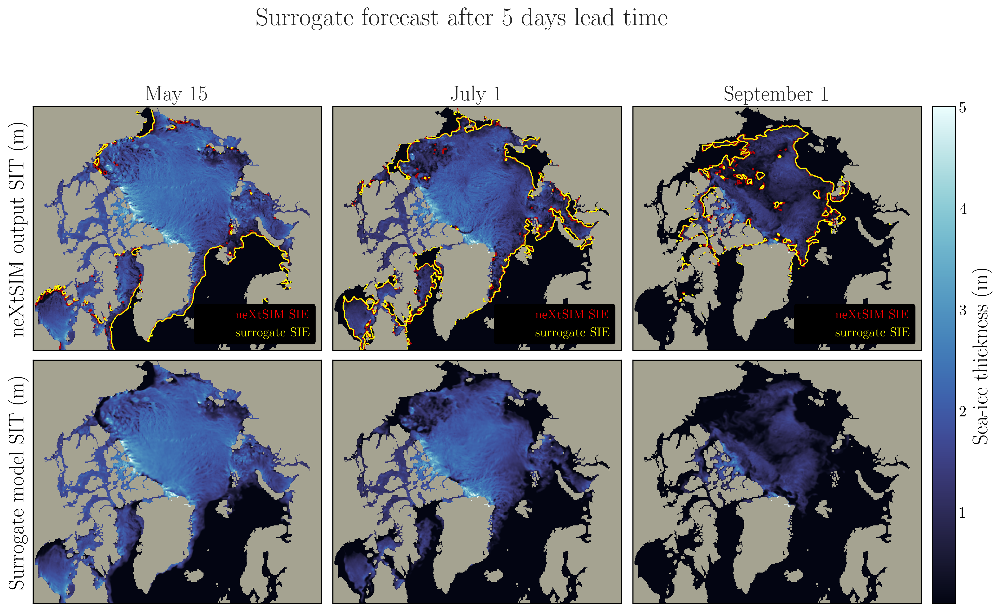

In [132]:
truth_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_540.npy')
pred_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_540.npy').squeeze()

truth_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_724.npy')
pred_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_724.npy').squeeze()

truth_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_972.npy')
pred_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_972.npy').squeeze()

truth_15May = reverse_normalize_input(truth_15May).squeeze()
pred_15May = reverse_normalize_input(pred_15May)

truth_1July = reverse_normalize_input(truth_1July).squeeze()
pred_1July = reverse_normalize_input(pred_1July)

truth_1September = reverse_normalize_input(truth_1September).squeeze()
pred_1September = reverse_normalize_input(pred_1September)

threshold = 0.1
class_pred_15May = [pred_15May[10]>threshold][0]
class_truth_15May = [truth_15May[10]>threshold][0]

class_pred_1July = [pred_1July[10]>threshold][0]
class_truth_1July = [truth_1July[10]>threshold][0]

class_pred_1September = [pred_1September[10]>threshold][0]
class_truth_1September = [truth_1September[10]>threshold][0]



fs = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]
fspers = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean_pers.npy')[:,:51]


mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')

plt.rcParams['legend.facecolor']='white'
fig = plt.figure(figsize = (15,13))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.04, hspace=0.04)

ax1 = plt.subplot2grid((3, 3), (0, 0))
ax2 = plt.subplot2grid((3, 3), (0, 1), colspan=1)
ax3 = plt.subplot2grid((3, 3), (0, 2), colspan=1)
ax4 = plt.subplot2grid((3, 3), (1, 0), colspan=1)
ax5 = plt.subplot2grid((3, 3), (1, 1), colspan=1)
ax6 = plt.subplot2grid((3, 3), (1, 2), colspan=1)
Y = np.arange(432)
X =np.arange(512)
ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])
ax2.grid(False)
ax2.set_xticks([])
ax2.set_yticks([])
ax3.grid(False)
ax3.set_xticks([])
ax3.set_yticks([])
ax4.grid(False)
ax4.set_xticks([])
ax4.set_yticks([])
ax5.grid(False)
ax5.set_xticks([])
ax5.set_yticks([])
ax6.grid(False)
ax6.set_xticks([])
ax6.set_yticks([])
ax1.set_facecolor('xkcd:cement')
ax2.set_facecolor('xkcd:cement')
ax3.set_facecolor('xkcd:cement')
ax4.set_facecolor('xkcd:cement')
ax5.set_facecolor('xkcd:cement')
ax6.set_facecolor('xkcd:cement')

cmap = colors.LinearSegmentedColormap.from_list('sea_ice', cmocean.cm.ice(np.linspace(0.0, 1.0, 256)))
cmap.set_under(cmocean.cm.ice(0.))

im1 = ax1.imshow(ma.masked_array(truth_15May[10,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im2 = ax4.imshow(ma.masked_array(pred_15May[10,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
CS = ax1.contour(X, Y, ma.masked_array(class_pred_15May[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS2 = ax1.contour(X, Y, ma.masked_array(class_truth_15May[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS2.collections[0].set_label('neXtSIM SIE')
CS.collections[0].set_label('surrogate SIE')

im4 = ax2.imshow(ma.masked_array(truth_1July[10,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im5 = ax5.imshow(ma.masked_array(pred_1July[10,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
C3 = ax2.contour(X, Y, ma.masked_array(class_pred_1July[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS4 = ax2.contour(X, Y, ma.masked_array(class_truth_1July[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS4.collections[0].set_label('neXtSIM SIE')
C3.collections[0].set_label('surrogate SIE')

im7 = ax3.imshow(ma.masked_array(truth_1September[10,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im8 = ax6.imshow(ma.masked_array(pred_1September[10,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
C5 = ax3.contour(X, Y, ma.masked_array(class_pred_1September[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS6 = ax3.contour(X, Y, ma.masked_array(class_truth_1September[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS6.collections[0].set_label('neXtSIM SIE')
C5.collections[0].set_label('surrogate SIE')

legend1 = ax1.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')
legend2 = ax2.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')
legend3 = ax3.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')

#legend1 = ax1.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', frameon = True, labelcolor='linecolor')
#legend2 = ax2.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', frameon = True, labelcolor='linecolor')
#legend3 = ax3.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', frameon = True, labelcolor='linecolor')
frame3 = legend3.get_frame()
frame3.set_color('black')
frame2 = legend2.get_frame()
frame2.set_color('black')
frame1 = legend1.get_frame()
frame1.set_color('black')

ax1.set_title('May 15', fontsize = 20)
ax2.set_title('July 1', fontsize = 20)
ax3.set_title('September 1', fontsize = 20)

ax1.set_ylabel('neXtSIM output SIT (m)', fontsize = 20)
ax4.set_ylabel('Surrogate model SIT (m)', fontsize =  20)

#fig.colorbar(im1,ax=[axs['a)'],axs['d)'],axs['g)']],aspect= 25., pad = 0.05)
#fig.colorbar(im3,ax=[axs['c)'],axs['f)'],axs['i)']],aspect= 25. ,pad = 0.04)
cbar_ax2 = fig.add_axes([0.91, 0.38, 0.02,0.5])

cb = fig.colorbar(im1,ax =[ax3, ax6], cax=cbar_ax2, aspect= 18.5, pad = 0)
cb.ax.tick_params(labelsize=15)
cb.ax.tick_params(labelsize=15)
cb.set_label('Sea-ice thickness (m)', fontsize = 20)

plt.suptitle('Surrogate forecast after 5 days lead time', fontsize = 24)
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig14.png', dpi = 300)



### Fig Appendix: Surrogate after 25 lead days

<ipython-input-133-cae6240dc2ea>:83: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS2.collections[0].set_label('neXtSIM SIE')
<ipython-input-133-cae6240dc2ea>:84: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS.collections[0].set_label('surrogate SIE')
<ipython-input-133-cae6240dc2ea>:90: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS4.collections[0].set_label('neXtSIM SIE')
<ipython-input-133-cae6240dc2ea>:91: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  C3.collections[0].set_label('surrogate SIE')
<ipython-input-133-cae6240dc2ea>:97: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 

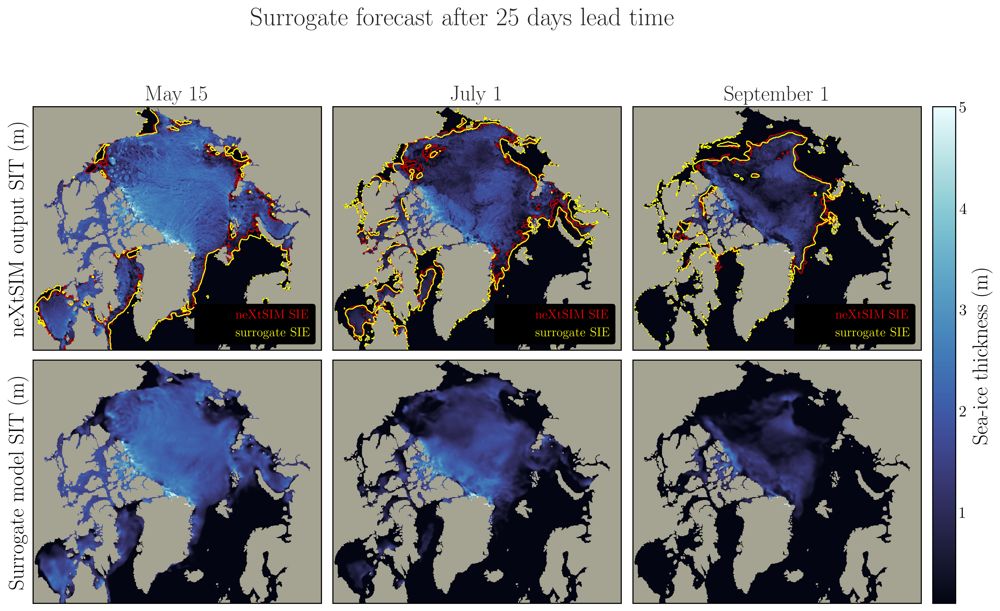

In [133]:
truth_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_540.npy')
pred_15May = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_540.npy').squeeze()

truth_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_724.npy')
pred_1July = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_724.npy').squeeze()

truth_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_truth_972.npy')
pred_1September = np.load(path_1ts_lambda100 +'figures/clip_cycle_1320_pred_972.npy').squeeze()

truth_15May = reverse_normalize_input(truth_15May).squeeze()
pred_15May = reverse_normalize_input(pred_15May)

truth_1July = reverse_normalize_input(truth_1July).squeeze()
pred_1July = reverse_normalize_input(pred_1July)

truth_1September = reverse_normalize_input(truth_1September).squeeze()
pred_1September = reverse_normalize_input(pred_1September)

threshold = 0.1
class_pred_15May = [pred_15May[50]>threshold][0]
class_truth_15May = [truth_15May[50]>threshold][0]

class_pred_1July = [pred_1July[50]>threshold][0]
class_truth_1July = [truth_1July[50]>threshold][0]

class_pred_1September = [pred_1September[50]>threshold][0]
class_truth_1September = [truth_1September[50]>threshold][0]



fs = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean.npy')[:,:51]
fspers = np.load(path_1ts_lambda100 +'clip_cycle_1320_fs_mean_pers.npy')[:,:51]


mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')

plt.rcParams['legend.facecolor']='white'
fig = plt.figure(figsize = (15., 13))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.04, hspace=0.04)

ax1 = plt.subplot2grid((3, 3), (0, 0))
ax2 = plt.subplot2grid((3, 3), (0, 1), colspan=1)
ax3 = plt.subplot2grid((3, 3), (0, 2), colspan=1)
ax4 = plt.subplot2grid((3, 3), (1, 0), colspan=1)
ax5 = plt.subplot2grid((3, 3), (1, 1), colspan=1)
ax6 = plt.subplot2grid((3, 3), (1, 2), colspan=1)
Y = np.arange(432)
X =np.arange(512)
ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])
ax2.grid(False)
ax2.set_xticks([])
ax2.set_yticks([])
ax3.grid(False)
ax3.set_xticks([])
ax3.set_yticks([])
ax4.grid(False)
ax4.set_xticks([])
ax4.set_yticks([])
ax5.grid(False)
ax5.set_xticks([])
ax5.set_yticks([])
ax6.grid(False)
ax6.set_xticks([])
ax6.set_yticks([])
ax1.set_facecolor('xkcd:cement')
ax2.set_facecolor('xkcd:cement')
ax3.set_facecolor('xkcd:cement')
ax4.set_facecolor('xkcd:cement')
ax5.set_facecolor('xkcd:cement')
ax6.set_facecolor('xkcd:cement')

cmap = colors.LinearSegmentedColormap.from_list('sea_ice', cmocean.cm.ice(np.linspace(0.0, 1.0, 256)))
cmap.set_under(cmocean.cm.ice(0.))

im1 = ax1.imshow(ma.masked_array(truth_15May[50,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im2 = ax4.imshow(ma.masked_array(pred_15May[50,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
CS = ax1.contour(X, Y, ma.masked_array(class_pred_15May[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS2 = ax1.contour(X, Y, ma.masked_array(class_truth_15May[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS2.collections[0].set_label('neXtSIM SIE')
CS.collections[0].set_label('surrogate SIE')

im4 = ax2.imshow(ma.masked_array(truth_1July[50,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im5 = ax5.imshow(ma.masked_array(pred_1July[50,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
C3 = ax2.contour(X, Y, ma.masked_array(class_pred_1July[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths =1)
CS4 = ax2.contour(X, Y, ma.masked_array(class_truth_1July[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS4.collections[0].set_label('neXtSIM SIE')
C3.collections[0].set_label('surrogate SIE')

im7 = ax3.imshow(ma.masked_array(truth_1September[50,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im8 = ax6.imshow(ma.masked_array(pred_1September[50,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
C5 = ax3.contour(X, Y, ma.masked_array(class_pred_1September[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths =1)
CS6 = ax3.contour(X, Y, ma.masked_array(class_truth_1September[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS6.collections[0].set_label('neXtSIM SIE')
C5.collections[0].set_label('surrogate SIE')
legend1 = ax1.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')
legend2 = ax2.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')
legend3 = ax3.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')

frame3 = legend3.get_frame()
frame3.set_color('black')
frame2 = legend2.get_frame()
frame2.set_color('black')
frame1 = legend1.get_frame()
frame1.set_color('black')

ax1.set_title('May 15', fontsize = 20)
ax2.set_title('July 1', fontsize = 20)
ax3.set_title('September 1', fontsize = 20)

ax1.set_ylabel('neXtSIM output SIT (m)', fontsize = 20)
ax4.set_ylabel('Surrogate model SIT (m)', fontsize =  20)

#fig.colorbar(im1,ax=[axs['a)'],axs['d)'],axs['g)']],aspect= 25., pad = 0.05)
#fig.colorbar(im3,ax=[axs['c)'],axs['f)'],axs['i)']],aspect= 25. ,pad = 0.04)
cbar_ax2 = fig.add_axes([0.91, 0.38, 0.02,0.5])

cb = fig.colorbar(im1,ax =[ax3, ax6], cax=cbar_ax2, aspect= 18.5, pad = 0)
cb.ax.tick_params(labelsize=15)
cb.ax.tick_params(labelsize=15)
cb.set_label('Sea-ice thickness (m)', fontsize = 20)

plt.suptitle('Surrogate forecast after 25 days lead time', fontsize = 24)
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig15.png', dpi = 300)



### Fig Appendix: Surrogate for seasonal forecast

<ipython-input-134-76ee10534868>:66: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS2.collections[0].set_label('neXtSIM SIE')
<ipython-input-134-76ee10534868>:67: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS.collections[0].set_label('surrogate SIE')
<ipython-input-134-76ee10534868>:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  CS4.collections[0].set_label('neXtSIM SIE')
<ipython-input-134-76ee10534868>:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  C3.collections[0].set_label('surrogate SIE')
<ipython-input-134-76ee10534868>:80: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 

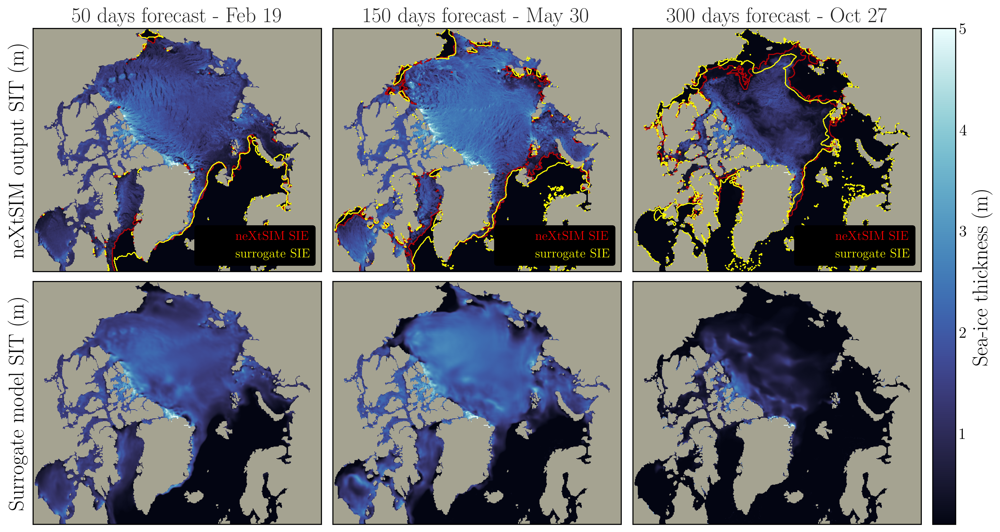

In [134]:
truth_15May = np.load(path_1ts_lambda100 +'clip_cycle_1_truth_0.npy')
pred_15May = np.load(path_1ts_lambda100 +'clip_cycle_1_pred_0.npy').squeeze()



truth_15May = reverse_normalize_input(truth_15May)
pred_15May = reverse_normalize_input(pred_15May)

threshold = 0.2
class_pred_15May1 = [pred_15May[100]>threshold][0]
class_truth_15May1 = [truth_15May[100]>threshold][0]
class_pred_15May2 = [pred_15May[300]>threshold][0]
class_truth_15May2 = [truth_15May[300]>threshold][0]
class_pred_15May3 = [pred_15May[600]>threshold][0]
class_truth_15May3 = [truth_15May[600]>threshold][0]


mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')

plt.rcParams['legend.facecolor']='white'
fig = plt.figure(figsize = (15, 13))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.04, hspace=0.04)

ax1 = plt.subplot2grid((3, 3), (0, 0))
ax2 = plt.subplot2grid((3, 3), (0, 1), colspan=1)
ax3 = plt.subplot2grid((3, 3), (0, 2), colspan=1)
ax4 = plt.subplot2grid((3, 3), (1, 0), colspan=1)
ax5 = plt.subplot2grid((3, 3), (1, 1), colspan=1)
ax6 = plt.subplot2grid((3, 3), (1, 2), colspan=1)
X = np.arange(512)
Y = np.arange(432)
ax1.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])
ax2.grid(False)
ax2.set_xticks([])
ax2.set_yticks([])
ax3.grid(False)
ax3.set_xticks([])
ax3.set_yticks([])
ax4.grid(False)
ax4.set_xticks([])
ax4.set_yticks([])
ax5.grid(False)
ax5.set_xticks([])
ax5.set_yticks([])
ax6.grid(False)
ax6.set_xticks([])
ax6.set_yticks([])
ax1.set_facecolor('xkcd:cement')
ax2.set_facecolor('xkcd:cement')
ax3.set_facecolor('xkcd:cement')
ax4.set_facecolor('xkcd:cement')
ax5.set_facecolor('xkcd:cement')
ax6.set_facecolor('xkcd:cement')

cmap = colors.LinearSegmentedColormap.from_list('sea_ice', cmocean.cm.ice(np.linspace(0.0, 1.0, 256)))
cmap.set_under(cmocean.cm.ice(0))

im1 = ax1.imshow(ma.masked_array(truth_15May[100,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im2 = ax4.imshow(ma.masked_array(pred_15May[100,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
CS = ax1.contour(X, Y, ma.masked_array(class_pred_15May1[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS2 = ax1.contour(X, Y, ma.masked_array(class_truth_15May1[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS2.collections[0].set_label('neXtSIM SIE')
CS.collections[0].set_label('surrogate SIE')

im4 = ax2.imshow(ma.masked_array(truth_15May[300,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im5 = ax5.imshow(ma.masked_array(pred_15May[300,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin =0.1, vmax = 5)
C3 = ax2.contour(X, Y, ma.masked_array(class_pred_15May2[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS4 = ax2.contour(X, Y, ma.masked_array(class_truth_15May2[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS4.collections[0].set_label('neXtSIM SIE')
C3.collections[0].set_label('surrogate SIE')

im6 = ax3.imshow(ma.masked_array(truth_15May[600,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
im7 = ax6.imshow(ma.masked_array(pred_15May[600,80:], mask = 1- mask[80:]), cmap = cmap, origin = 'lower', vmin = 0.1, vmax = 5)
C5 = ax3.contour(X, Y, ma.masked_array(class_pred_15May3[80:], mask = 1 - mask[80:]), colors = 'yellow', linewidths = 1)
CS6 = ax3.contour(X, Y, ma.masked_array(class_truth_15May3[80:], mask = 1 - mask[80:]), colors = 'red', linewidths = 1, alpha= 0.7)
CS6.collections[0].set_label('neXtSIM SIE')
C5.collections[0].set_label('surrogate SIE')


legend1 = ax1.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')
legend2 = ax2.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')
legend3 = ax3.legend(markerscale = 10, facecolor = 'black', edgecolor = 'black', framealpha=1,frameon = True, labelcolor=['red','yellow'], fontsize=12, loc = 'lower right')

frame3 = legend3.get_frame()
frame3.set_color('black')
frame2 = legend2.get_frame()
frame2.set_color('black')
frame1 = legend1.get_frame()
frame1.set_color('black')

ax1.set_title('50 days forecast - Feb 19', fontsize = 20)
ax2.set_title('150 days forecast - May 30', fontsize = 20)
ax3.set_title('300 days forecast - Oct 27', fontsize = 20)

ax1.set_ylabel('neXtSIM output SIT (m)', fontsize = 20)
ax4.set_ylabel('Surrogate model SIT (m)', fontsize =  20)
cbar_ax2 = fig.add_axes([0.91, 0.38, 0.02,0.5])

cb = fig.colorbar(im1,ax =[ax3, ax6], cax=cbar_ax2, aspect= 18.5, pad = 0)
cb.ax.tick_params(labelsize=15)
cb.ax.tick_params(labelsize=15)
cb.set_label('Sea-ice thickness (m)', fontsize = 20)

#fig.colorbar(im1,ax=[axs['a)'],axs['d)'],axs['g)']],aspect= 25., pad = 0.05)
#fig.colorbar(im3,ax=[axs['c)'],axs['f)'],axs['i)']],aspect= 25. ,pad = 0.04)
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig16.png', dpi = 300)





## CMIP forcings

In [135]:
fsCMIP = np.load(path_1ts_lambda100 + 'CMIP_before_cycle_25_fs_mean.npy')*ratio_N
fs_pers = np.load(path_1ts_lambda100 + 'CMIP_before_cycle_25_fs_mean_pers.npy')*ratio_N
fs = np.load(path_1ts_lambda100 + 'before_cycle_25_fs_mean.npy')*ratio_N
# Data Utils
TIME_PATH = 'time_test_2006_2009.npy'

#Load time information
time = np.load(TIME_PATH, allow_pickle = True)

N = np.shape(time)[0]
new_time = []
for n in range(N):
    new_time.append(datetime.strptime(str(time[n])[:19],'%Y-%m-%dT%H:%M:%S').strftime("%y-%m-%d"))

#plt utils
plt.rcParams['axes.facecolor']='xkcd:white'



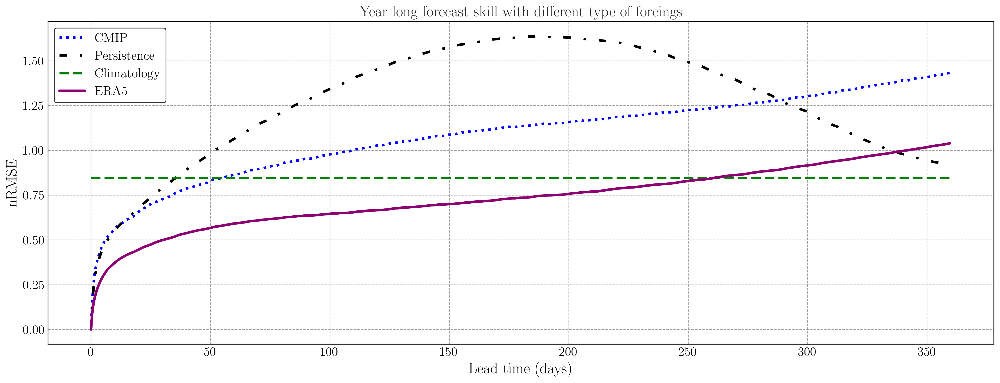

In [136]:
mpl.rc('axes',edgecolor='k')
mpl.rc('legend',edgecolor='k')
mpl.rc('legend',facecolor='white')
fig, ax =plt.subplots(1, 1,figsize = (20, 7))
N = np.arange((720))/2
plt.plot(N, fsCMIP.mean(axis = 0), label = 'CMIP', color = 'blue', linestyle = 'dotted')
plt.plot(N, fs_pers.mean(axis = 0),label = 'Persistence', color = 'black', alpha = 1, linestyle = (0, (3,5,1,5)))
plt.hlines(0.41*ratio_N, 0, 720//2, color = 'green', label = 'Climatology', linestyle = 'dashed')
plt.plot(N, fs.mean(axis = 0),label = 'ERA5', color=dict_color["1_ts_lambda100"])
plt.xlabel('Lead time (days)', fontsize = 18)
plt.ylabel('nRMSE', fontsize = 18)
plt.title('Year long forecast skill with different type of forcings', fontsize = 18)
plt.legend(fontsize = 18)
plt.xticks(fontsize = 15)

plt.yticks(fontsize = 15)
legend1 = ax.legend(markerscale = 10, facecolor = 'white', edgecolor = 'black', frameon = True, labelcolor='k', fontsize =  15, loc = 'upper left')

plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig17.png', dpi = 300)


(1320, 9, 7)


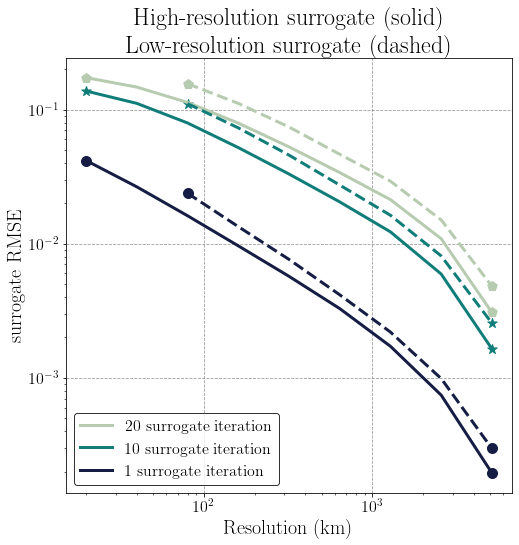

In [4]:
rmse = np.load('Results/1Mars/UNet_lambda100_mu0_nu0/cycle_1320_rmse_total.npy')
rmse_pers = np.load('Results/1Mars/UNet_lambda100_mu0_nu0/cycle_1320_rmse_pers_total.npy')
rmse_lr = np.load('/libre2/durandc/durandc/data/Results_HR/cycle_1320_rmse_total.npy')
rmse_lr_pers = np.load('/libre2/durandc/durandc/data/Results_HR/cycle_1320_rmse_pers_total.npy')


cmap = plt.get_cmap('cmo.tempo_r')
colors = cmap(np.linspace(0,1,6))
markers = ['o','v','*','s','p','h']
print(np.shape(rmse))
it = [1, 5, 10, 15,20,25]
kil = [2*10, 4*10,8*10,16*10,32*10,64*10,128*10,256*10,512*10]
res = np.arange(1,10,1)
plt.figure(figsize = (8,8))
for i in range(4,-1,-2):
    plt.loglog(kil, rmse[:,:,i].mean(axis = 0), c= colors[i], label = '{} surrogate iteration'.format(str(it[i]))    )
    plt.loglog(kil[2:], rmse_lr[:,:,i].mean(axis = 0),'--', c= colors[i]  )
    plt.scatter([kil[0], kil[-1]],[rmse[:,0,i].mean(axis = 0), rmse[:,-1,i].mean(axis = 0)], color= colors[i], marker = markers[i])
    plt.scatter([kil[2], kil[-1]],[rmse_lr[:,0,i].mean(axis = 0), rmse_lr[:,-1,i].mean(axis = 0)], color= colors[i], marker = markers[i])
plt.legend()
plt.xlabel('Resolution (km)')
plt.ylabel('surrogate RMSE')
plt.title('High-resolution surrogate (solid)\n Low-resolution surrogate (dashed)')
plt.savefig('../../../../../../../../cerea_raid/users/durandc/Figures/fig13.png', dpi = 300)